# Introduction

<center><img src="https://i.imgur.com/9hLRsjZ.jpg" height=400></center>

This dataset was scraped from [nextspaceflight.com](https://nextspaceflight.com/launches/past/?page=1) and includes all the space missions since the beginning of Space Race between the USA and the Soviet Union in 1957!

### Install Package with Country Codes

In [ ]:
%pip install iso3166

Note: you may need to restart the kernel to use updated packages.


### Upgrade Plotly

Run the cell below if you are working with Google Colab.

In [ ]:
%pip install --upgrade plotly

Note: you may need to restart the kernel to use updated packages.


### Import Statements

In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# These might be helpful:
from iso3166 import countries
from datetime import datetime, timedelta

### Notebook Presentation

In [ ]:
pd.options.display.float_format = '{:,.2f}'.format

### Load the Data

In [ ]:
df = pd.read_csv('mission_launches.csv')

# Preliminary Data Exploration

* What is the shape of `df_data`?
* How many rows and columns does it have?
* What are the column names?
* Are there any NaN values or duplicates?

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4324 entries, 0 to 4323
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0.1    4324 non-null   int64 
 1   Unnamed: 0      4324 non-null   int64 
 2   Organisation    4324 non-null   object
 3   Location        4324 non-null   object
 4   Date            4324 non-null   object
 5   Detail          4324 non-null   object
 6   Rocket_Status   4324 non-null   object
 7   Price           964 non-null    object
 8   Mission_Status  4324 non-null   object
dtypes: int64(2), object(7)
memory usage: 304.2+ KB


In [ ]:
df.shape

(4324, 9)

In [ ]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Organisation', 'Location', 'Date',
       'Detail', 'Rocket_Status', 'Price', 'Mission_Status'],
      dtype='object')

In [ ]:
df

,Unnamed: 0.1,Unnamed: 0,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status
0,0,0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,1,1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,2,2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,3,3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,4,4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success
...,...,...,...,...,...,...,...,...,...
4319,4319,4319,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Wed Feb 05, 1958 07:33 UTC",Vanguard | Vanguard TV3BU,StatusRetired,NaN,Failure
4320,4320,4320,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA","Sat Feb 01, 1958 03:48 UTC",Juno I | Explorer 1,StatusRetired,NaN,Success
4321,4321,4321,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Fri Dec 06, 1957 16:44 UTC",Vanguard | Vanguard TV3,StatusRetired,NaN,Failure
4322,4322,4322,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan","Sun Nov 03, 1957 02:30 UTC",Sputnik 8K71PS | Sputnik-2,StatusRetired,NaN,Success


## Data Cleaning - Check for Missing Values and Duplicates

Consider removing columns containing junk data.

In [ ]:
df.isna().any()

Unnamed: 0.1      False
Unnamed: 0        False
Organisation      False
Location          False
Date              False
Detail            False
Rocket_Status     False
Price              True
Mission_Status    False
dtype: bool

In [ ]:
df.duplicated().any()

False

In [ ]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Organisation', 'Location', 'Date',
       'Detail', 'Rocket_Status', 'Price', 'Mission_Status'],
      dtype='object')

In [ ]:
df.drop('Unnamed: 0.1', inplace=True, axis=1)

In [ ]:
df.drop('Unnamed: 0', inplace=True, axis=1)

In [ ]:
df

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success
...,...,...,...,...,...,...,...
4319,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Wed Feb 05, 1958 07:33 UTC",Vanguard | Vanguard TV3BU,StatusRetired,NaN,Failure
4320,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA","Sat Feb 01, 1958 03:48 UTC",Juno I | Explorer 1,StatusRetired,NaN,Success
4321,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Fri Dec 06, 1957 16:44 UTC",Vanguard | Vanguard TV3,StatusRetired,NaN,Failure
4322,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan","Sun Nov 03, 1957 02:30 UTC",Sputnik 8K71PS | Sputnik-2,StatusRetired,NaN,Success


## Descriptive Statistics

In [ ]:
df.describe()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status
count,4324,4324,4324,4324,4324,964,4324
unique,56,137,4319,4278,2,56,4
top,RVSN USSR,"Site 31/6, Baikonur Cosmodrome, Kazakhstan","Wed Nov 05, 2008 00:15 UTC",Cosmos-3MRB (65MRB) | BOR-5 Shuttle,StatusRetired,450.0,Success
freq,1777,235,2,6,3534,136,3879


# Number of Launches per Company

Create a chart that shows the number of space mission launches by organisation.

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success


In [ ]:
df_org = pd.DataFrame(df.Organisation.value_counts())
df_org.reset_index(inplace=True)
df_org.columns = (["Organization","Count_of_Missions"])
df_org.head()

,Organization,Count_of_Missions
0,RVSN USSR,1777
1,Arianespace,279
2,CASC,251
3,General Dynamics,251
4,NASA,203


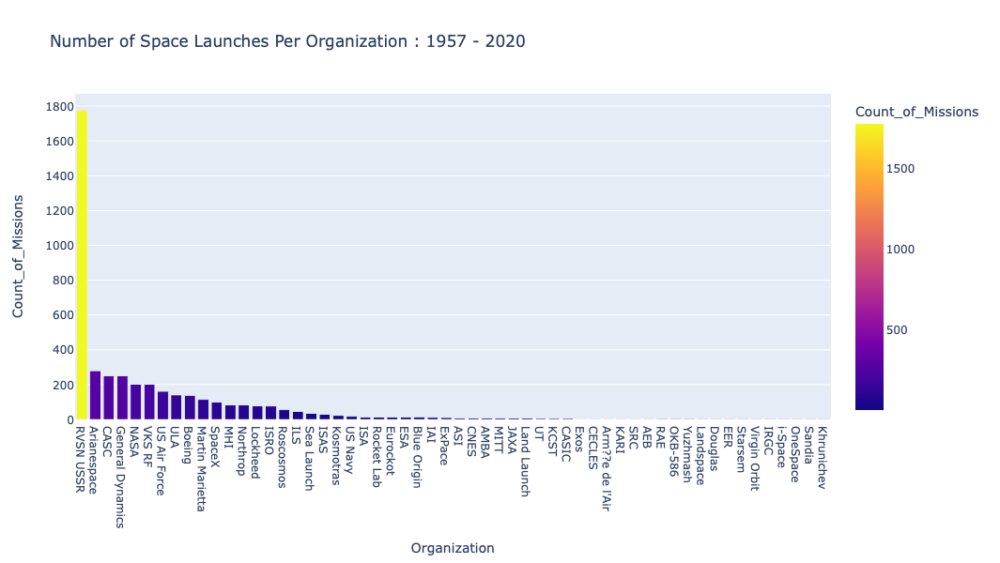

In [ ]:
fig = px.bar(df_org, x=df_org.Organization, y=df_org.Count_of_Missions,
             color=df_org.Count_of_Missions,
             height=600,
             title="Number of Space Launches Per Organization : 1957 - 2020"
            )
fig.show()

# Number of Active versus Retired Rockets

How many rockets are active compared to those that are decomissioned?

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success


In [ ]:
df_rocket_status = df.Rocket_Status.value_counts()

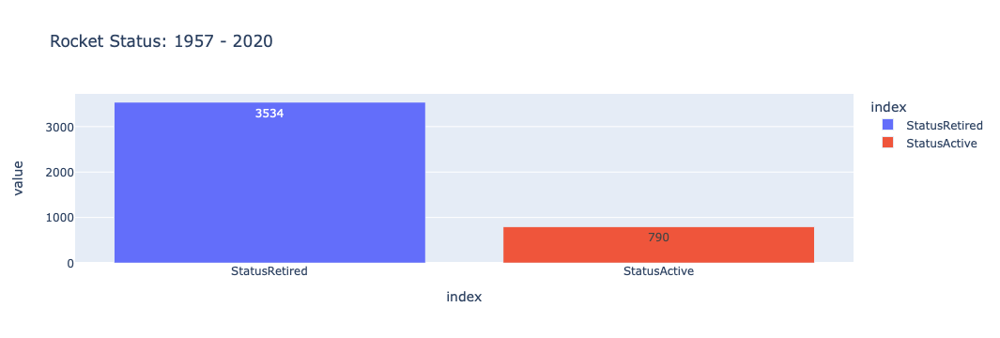

In [ ]:
fig = px.bar(df_rocket_status,
             color=df_rocket_status.index,
             text=df_rocket_status.values,
             title="Rocket Status: 1957 - 2020")
fig.show()

# Distribution of Mission Status

How many missions were successful?
How many missions failed?

In [ ]:
df_mission_status = df.Mission_Status.value_counts()

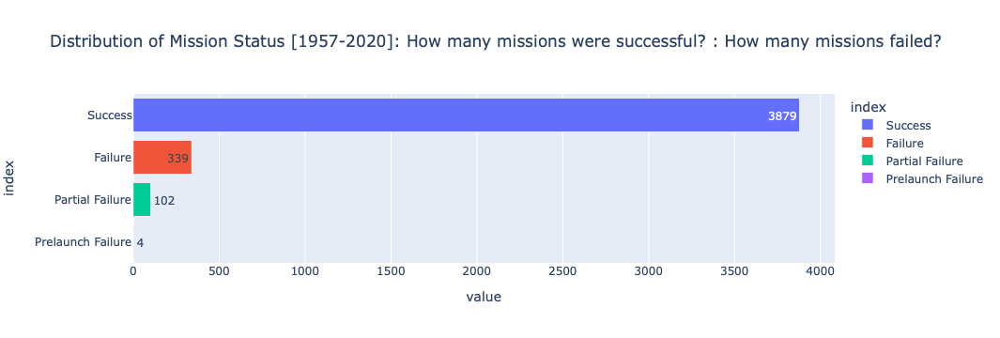

In [ ]:
fig = px.bar(df_mission_status, color=df_mission_status.index, orientation="h",
             text=df_mission_status.values,
             title="Distribution of Mission Status [1957-2020]: How many missions were successful? : How many missions failed?")
fig.show()

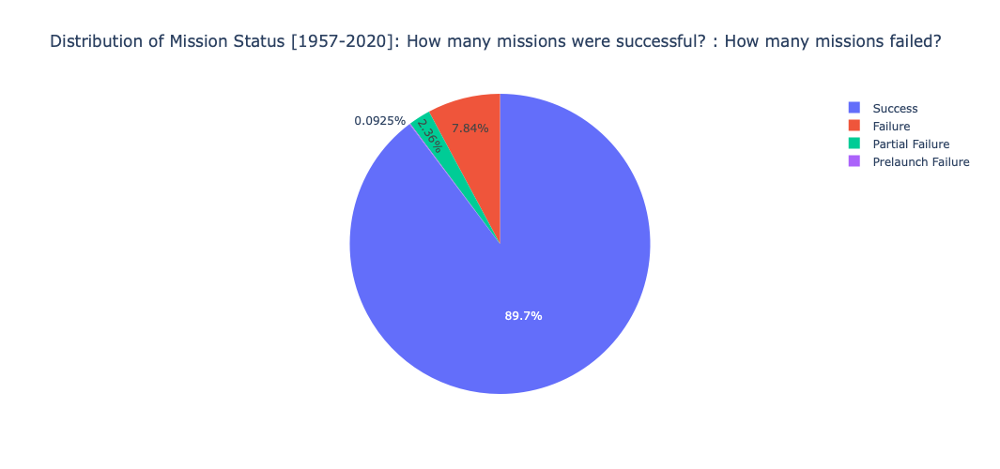

In [ ]:
fig = px.pie(names=df_mission_status.index, values=df_mission_status.values,
             color=df_mission_status.index, height=500,
             title="Distribution of Mission Status [1957-2020]: How many missions were successful? : How many missions failed?")
fig.show()

# How Expensive are the Launches?

Create a histogram and visualise the distribution. The price column is given in USD millions (careful of missing values).

In [ ]:
df.Price = pd.to_numeric(df.Price.str.replace(",",""))

In [ ]:
df.Price

0       50.00
1       29.75
2         NaN
3       65.00
4      145.00
        ...  
4319      NaN
4320      NaN
4321      NaN
4322      NaN
4323      NaN
Name: Price, Length: 4324, dtype: float64

In [ ]:
df.Price.dropna()

0       50.00
1       29.75
3       65.00
4      145.00
5       64.68
        ...  
3855    59.00
3971    63.23
3993    63.23
4000    63.23
4020    63.23
Name: Price, Length: 964, dtype: float64

In [ ]:
print(min(df.Price))
print(max(df.Price))

5.3
5000.0


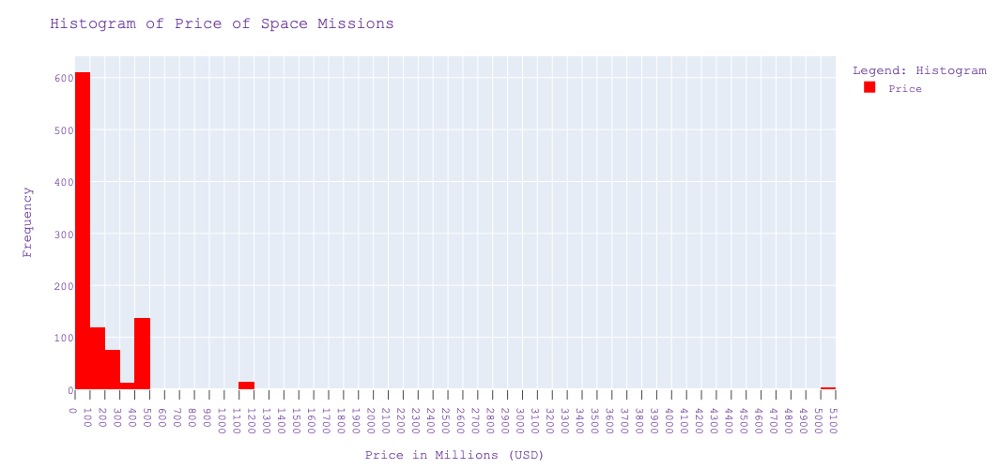

In [ ]:
fig = px.histogram(df.Price,
                   height=500,
                   nbins=50,
                   color_discrete_sequence=["red"]
              )

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=10,
    dtick=100,
)

fig.update_layout(
    #bargap=0.2,
    title="Histogram of Price of Space Missions",
    xaxis_title="Price in Millions (USD)",
    yaxis_title="Frequency",
    legend_title="Legend: Histogram",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)


fig.show()

# Use a Choropleth Map to Show the Number of Launches by Country

* Create a choropleth map using [the plotly documentation](https://plotly.com/python/choropleth-maps/)
* Experiment with [plotly's available colours](https://plotly.com/python/builtin-colorscales/). I quite like the sequential colour `matter` on this map.
* You'll need to extract a `country` feature as well as change the country names that no longer exist.

Wrangle the Country Names

You'll need to use a 3 letter country code for each country. You might have to change some country names.

* Russia is the Russian Federation
* New Mexico should be USA
* Yellow Sea refers to China
* Shahrud Missile Test Site should be Iran
* Pacific Missile Range Facility should be USA
* Barents Sea should be Russian Federation
* Gran Canaria should be USA


You can use the iso3166 package to convert the country names to Alpha3 format.

In [ ]:
df.Location

0              LC-39A, Kennedy Space Center, Florida, USA
1       Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...
2                           Pad A, Boca Chica, Texas, USA
3            Site 200/39, Baikonur Cosmodrome, Kazakhstan
4                SLC-41, Cape Canaveral AFS, Florida, USA
                              ...                        
4319             LC-18A, Cape Canaveral AFS, Florida, USA
4320             LC-26A, Cape Canaveral AFS, Florida, USA
4321             LC-18A, Cape Canaveral AFS, Florida, USA
4322            Site 1/5, Baikonur Cosmodrome, Kazakhstan
4323            Site 1/5, Baikonur Cosmodrome, Kazakhstan
Name: Location, Length: 4324, dtype: object

In [ ]:
df["Country"] = df.Location.str.split(",").str[-1].str.strip()

In [ ]:
df.Country.value_counts()

Russia                            1395
USA                               1344
Kazakhstan                         701
France                             303
China                              268
Japan                              126
India                               76
Pacific Ocean                       36
New Zealand                         13
Iran                                13
Israel                              11
Kenya                                9
Australia                            6
North Korea                          5
New Mexico                           4
South Korea                          3
Barents Sea                          3
Brazil                               3
Gran Canaria                         2
Pacific Missile Range Facility       1
Yellow Sea                           1
Shahrud Missile Test Site            1
Name: Country, dtype: int64

In [ ]:
df.Country[df["Country"] == "Russia"] = "Russian Federation"
df.Country[df["Country"] == "New Mexico"] = "USA"
df.Country[df["Country"] == "Yellow Sea"] = "China"
df.Country[df["Country"] == "Shahrud Missile Test Site"] = "Iran"
df.Country[df["Country"] == "Pacific Missile Range Facility"] = "USA"
df.Country[df["Country"] == "Barents Sea"] = "Russian Federation"
df.Country[df["Country"] == "Gran Canaria"] = "USA"
df.Country[df["Country"] == "Iran"] = "Iran, Islamic Republic of"
df.Country[df["Country"] == "South Korea"] = "Korea, Democratic People's Republic of"
df.Country[df["Country"] == "North Korea"] = "Korea, Republic of"
df.Country[df["Country"] == "Pacific Ocean"] = "USA"



/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipykernel_27420/4097695883.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipykernel_27420/4097695883.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipykernel_27420/4097695883.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipyker

In [ ]:
df.Country.value_counts()

Russian Federation                        1398
USA                                       1387
Kazakhstan                                 701
France                                     303
China                                      269
Japan                                      126
India                                       76
Iran, Islamic Republic of                   14
New Zealand                                 13
Israel                                      11
Kenya                                        9
Australia                                    6
Korea, Republic of                           5
Korea, Democratic People's Republic of       3
Brazil                                       3
Name: Country, dtype: int64

In [ ]:
countries.get("USA").alpha3

'USA'

In [ ]:
ISO = []
for c in df.Country:
    ISO.append(countries.get(c).alpha3)

In [ ]:
df["ISO"] = ISO

In [ ]:
df

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.00,Success,USA,USA
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,CHN
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,USA
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.00,Success,Kazakhstan,KAZ
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.00,Success,USA,USA
...,...,...,...,...,...,...,...,...,...
4319,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Wed Feb 05, 1958 07:33 UTC",Vanguard | Vanguard TV3BU,StatusRetired,NaN,Failure,USA,USA
4320,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA","Sat Feb 01, 1958 03:48 UTC",Juno I | Explorer 1,StatusRetired,NaN,Success,USA,USA
4321,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Fri Dec 06, 1957 16:44 UTC",Vanguard | Vanguard TV3,StatusRetired,NaN,Failure,USA,USA
4322,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan","Sun Nov 03, 1957 02:30 UTC",Sputnik 8K71PS | Sputnik-2,StatusRetired,NaN,Success,Kazakhstan,KAZ


In [ ]:
df_ISO_count = df.ISO.value_counts()

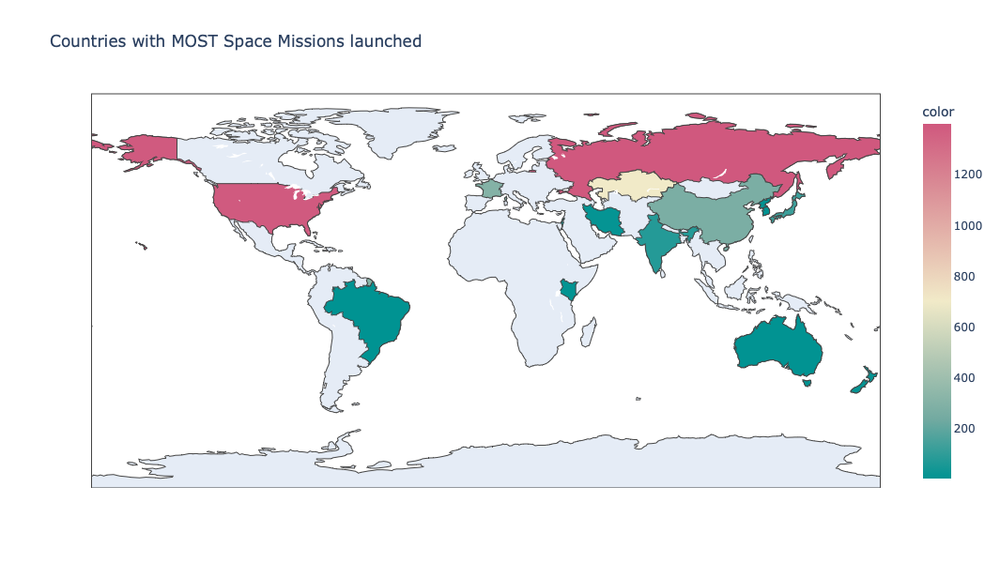

In [ ]:
fig = px.choropleth(locations=df_ISO_count.index,
                    color=df_ISO_count.values,
                    color_continuous_scale="tealrose",
                    title="Countries with MOST Space Missions launched",
                    height=600,
                   )
fig.show()

In [ ]:
df_ISO_count

RUS    1398
USA    1387
KAZ     701
FRA     303
CHN     269
JPN     126
IND      76
IRN      14
NZL      13
ISR      11
KEN       9
AUS       6
KOR       5
PRK       3
BRA       3
Name: ISO, dtype: int64

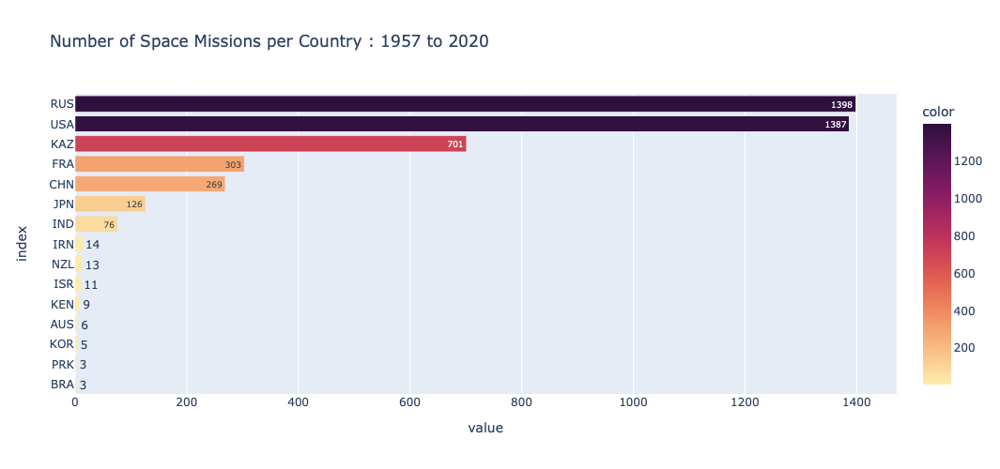

In [ ]:
fig = px.bar(df_ISO_count[::-1],
             color=df_ISO_count.values[::-1],
             color_continuous_scale="matter",
             orientation="h",
             text=df_ISO_count.values[::-1],
             height=500,
             title="Number of Space Missions per Country : 1957 to 2020"
            )

fig.show()

# Use a Choropleth Map to Show the Number of Failures by Country


In [ ]:
df_failures_ISO = df["ISO"][df.Mission_Status != "Success"].value_counts()


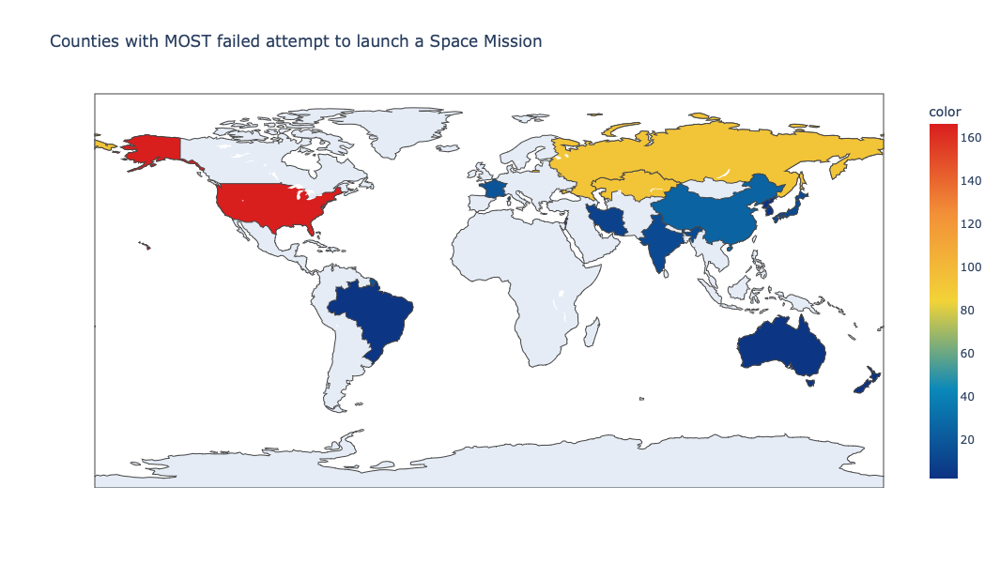

In [ ]:
fig = px.choropleth(locations=df_failures_ISO.index,
                    color=df_failures_ISO.values,
                    color_continuous_scale="portland",
                    title="Counties with MOST failed attempt to launch a Space Mission",
                    height=600
                   )
fig.show()

# Create a Plotly Sunburst Chart of the countries, organisations, and mission status.

In [ ]:
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO
910,Kosmotras,"Site 109/95, Baikonur Cosmodrome, Kazakhstan","Wed Jul 26, 2006 19:43 UTC",Dnepr | BelKa 1 & Others,StatusRetired,29.00,Failure,Kazakhstan,KAZ


In [ ]:
df_sunburst = df[["Country","Organisation","Mission_Status"]].groupby(
    ["Country","Organisation","Mission_Status"], as_index=False).value_counts()

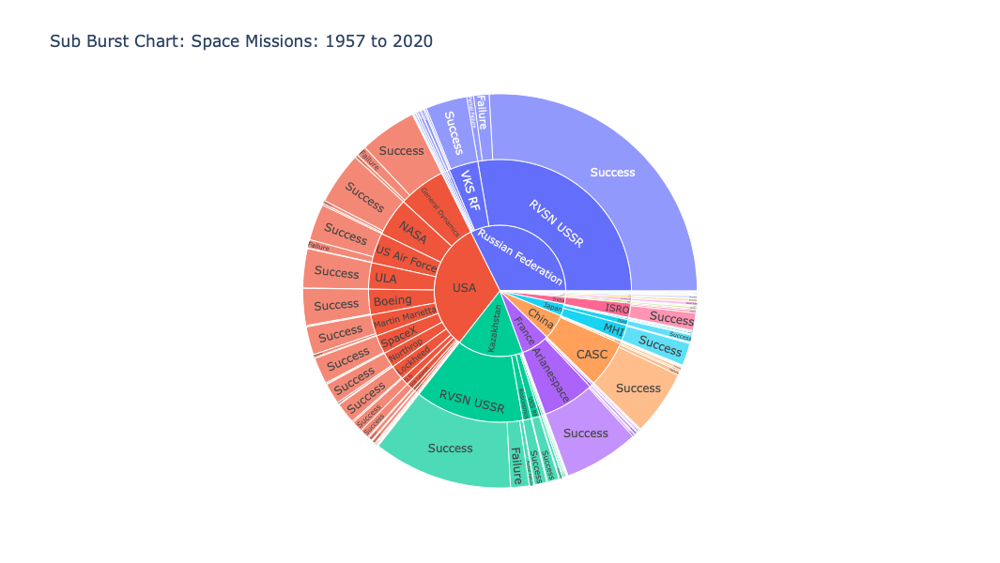

In [ ]:
fig = px.sunburst(df_sunburst,
                  path=['Country','Organisation','Mission_Status'],
                  values='count',
                  height=600,
                  title="Sub Burst Chart: Space Missions: 1957 to 2020"
                 )
fig.show()

# Analyse the Total Amount of Money Spent by Organisation on Space Missions

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.00,Success,USA,USA
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,CHN
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,USA
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.00,Success,Kazakhstan,KAZ
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.00,Success,USA,USA


In [ ]:
df_Money_Spent = df.groupby(["Organisation"], as_index=False).sum("Price").sort_values("Price", ascending=False)
df_Money_Spent = df_Money_Spent[df_Money_Spent["Price"] > 0]
df_Money_Spent["Price"] = df_Money_Spent["Price"] * 1000000
df_Money_Spent.head()

,Organisation,Price
35,NASA,"76,280,000,000.00"
3,Arianespace,"16,345,000,000.00"
48,ULA,"14,798,000,000.00"
40,RVSN USSR,"10,000,000,000.00"
7,CASC,"6,340,260,000.00"


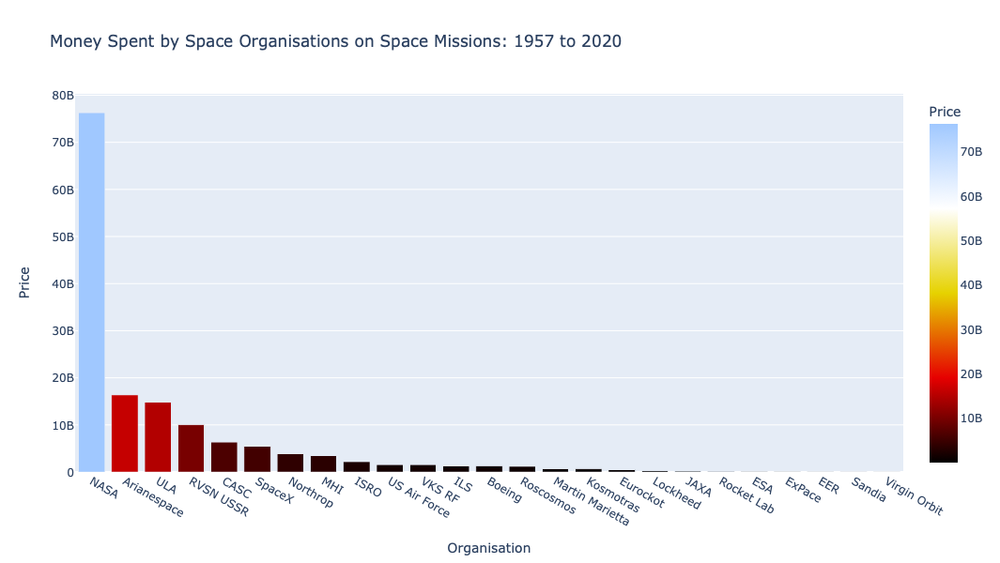

In [ ]:
fig = px.bar(df_Money_Spent,
             x="Organisation",
             y="Price",
             color="Price",
             height=600,
             title="Money Spent by Space Organisations on Space Missions: 1957 to 2020",
             color_continuous_scale="blackbody"
            )

fig.show()

# Analyse the Amount of Money Spent by Organisation per Launch

In [ ]:
df_Money_Spent_Each_Mession = df[["Organisation","Detail","Price"]].sort_values(by="Price", ascending=False)
df_Money_Spent_Each_Mession = df_Money_Spent_Each_Mession[df_Money_Spent_Each_Mession["Price"] > 0]
df_Money_Spent_Each_Mession["Price"] = df_Money_Spent_Each_Mession["Price"] * 1000000
df_Money_Spent_Each_Mession.set_index("Organisation", inplace=True)

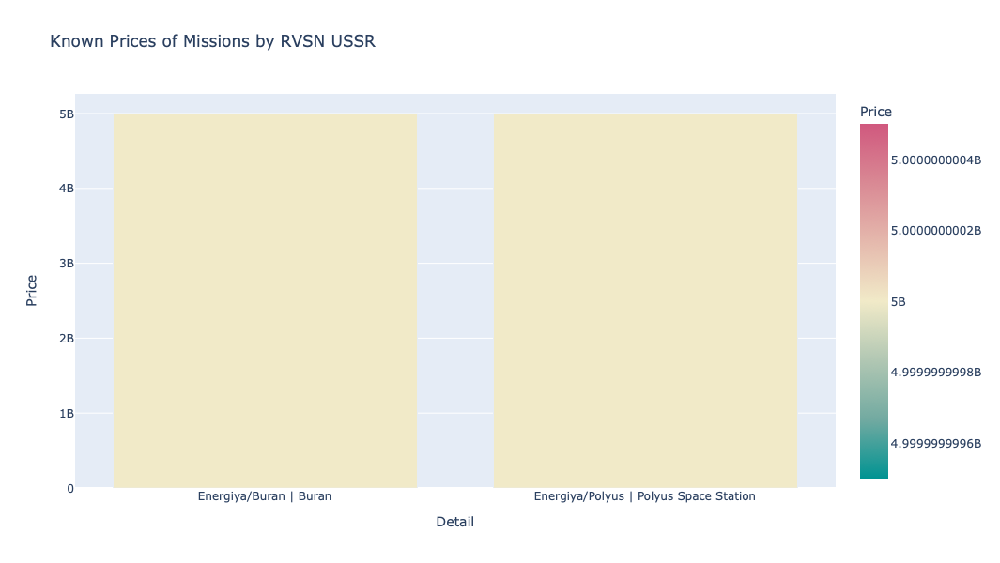

--------------------------------------------


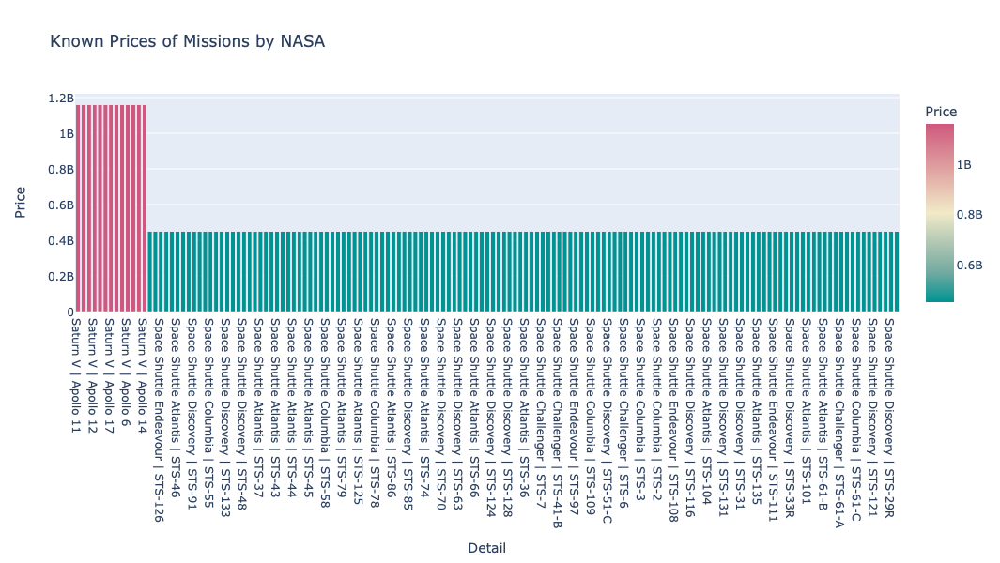

--------------------------------------------


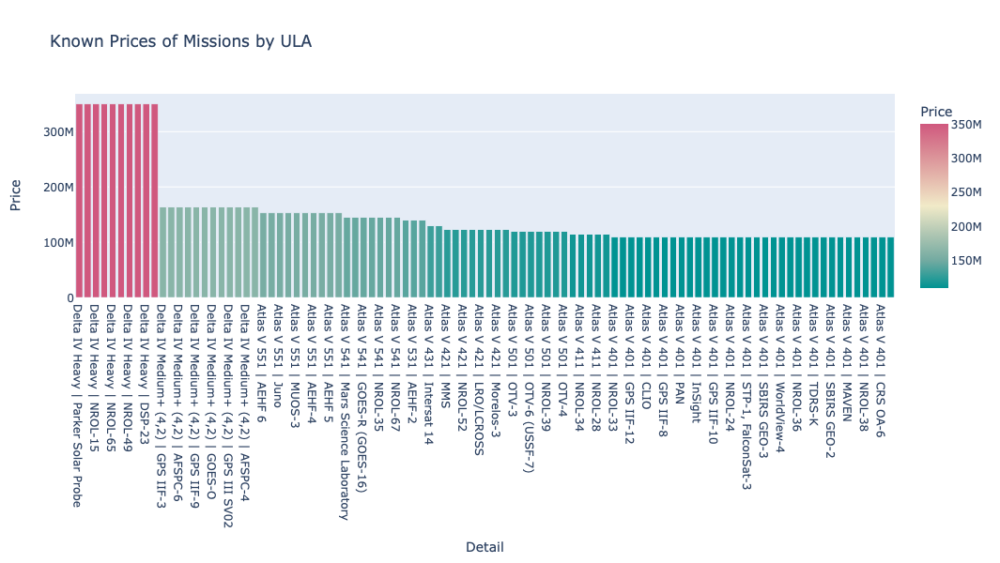

--------------------------------------------


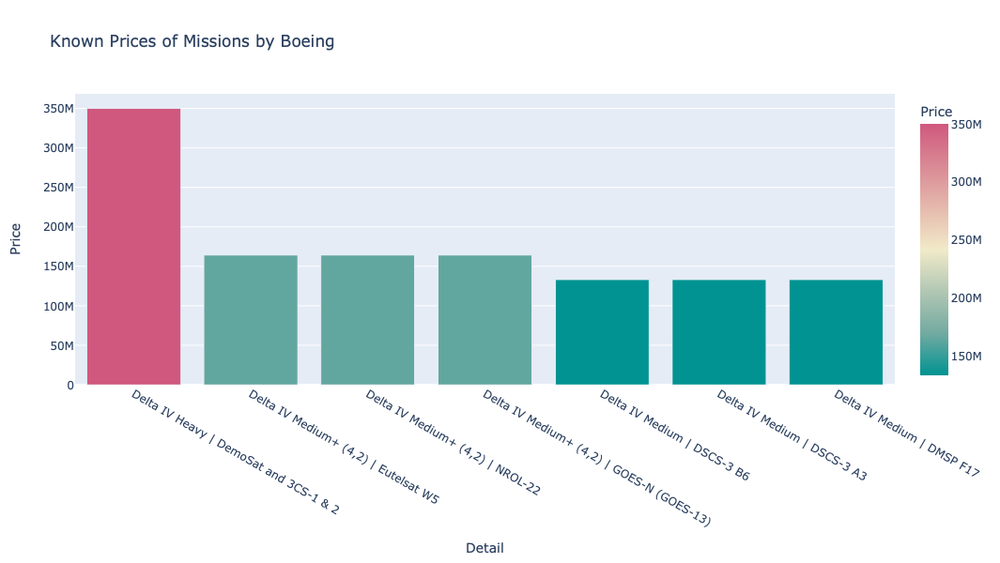

--------------------------------------------


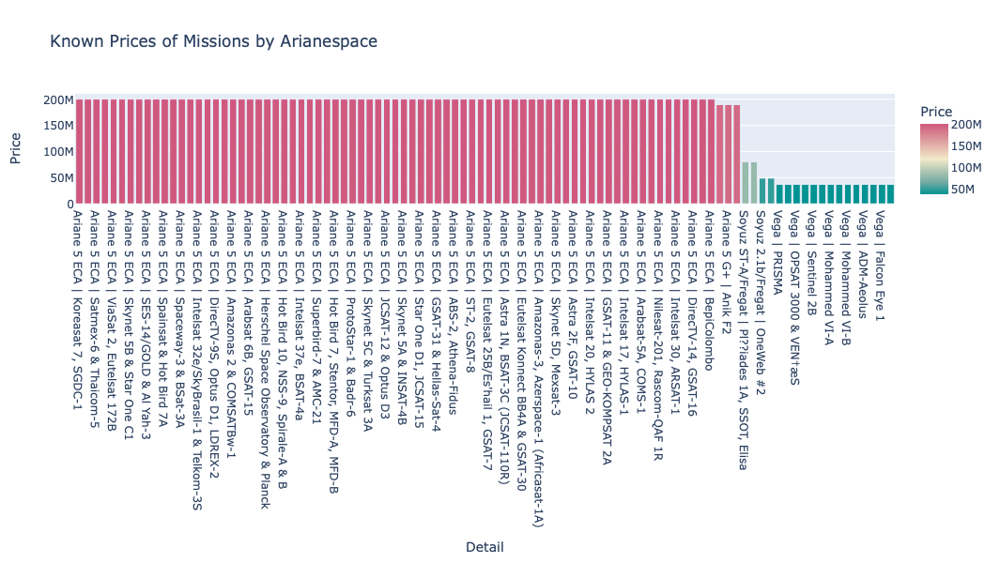

--------------------------------------------


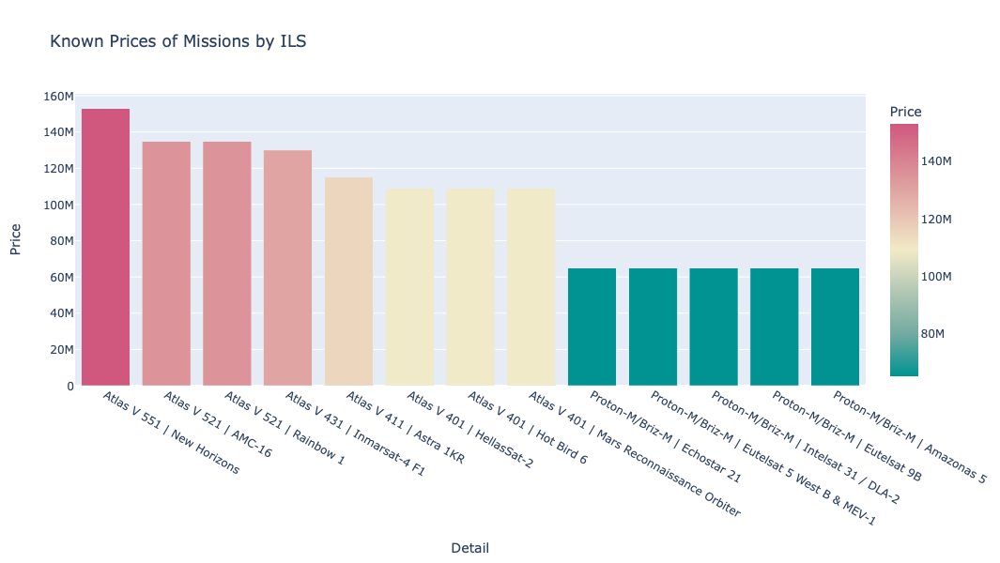

--------------------------------------------


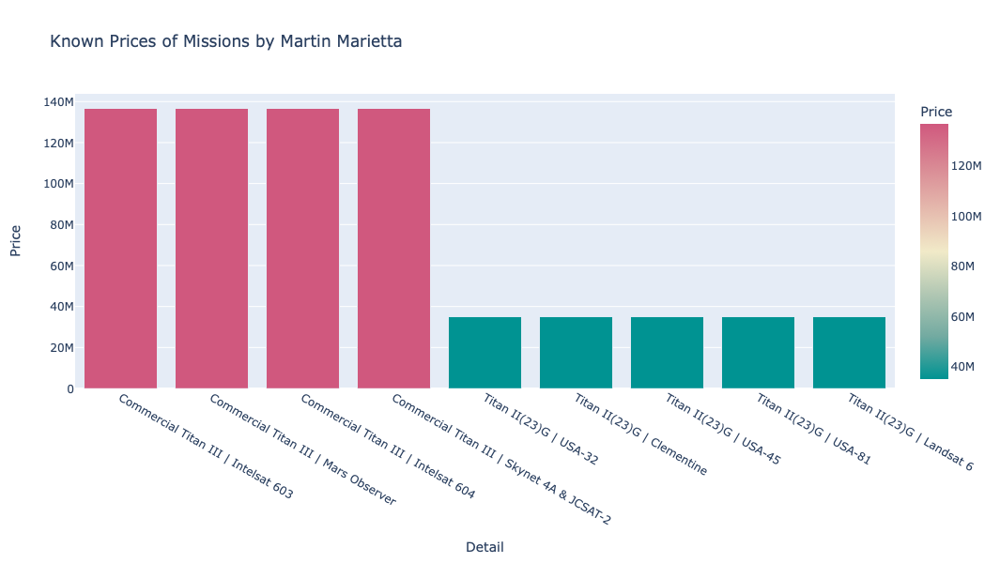

--------------------------------------------


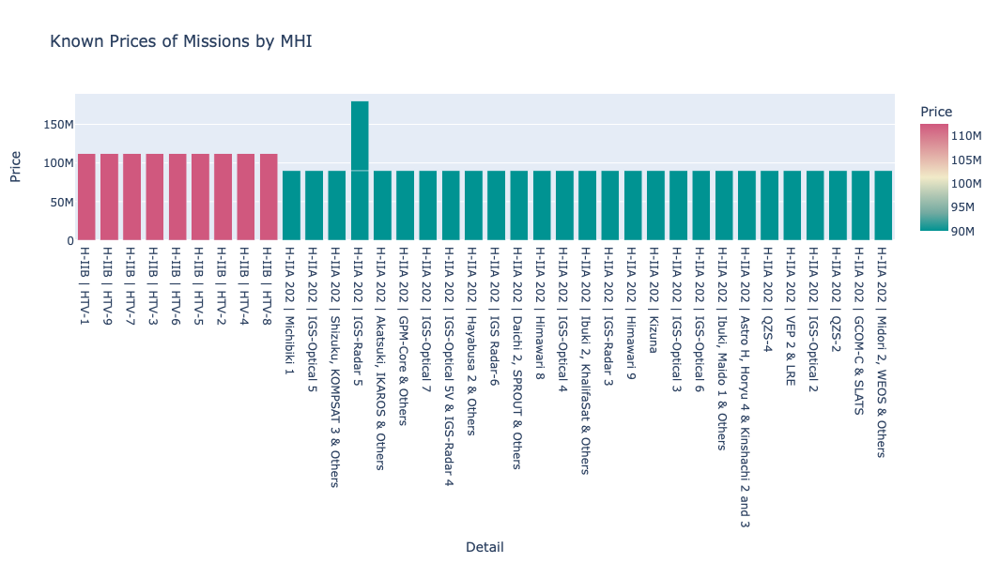

--------------------------------------------


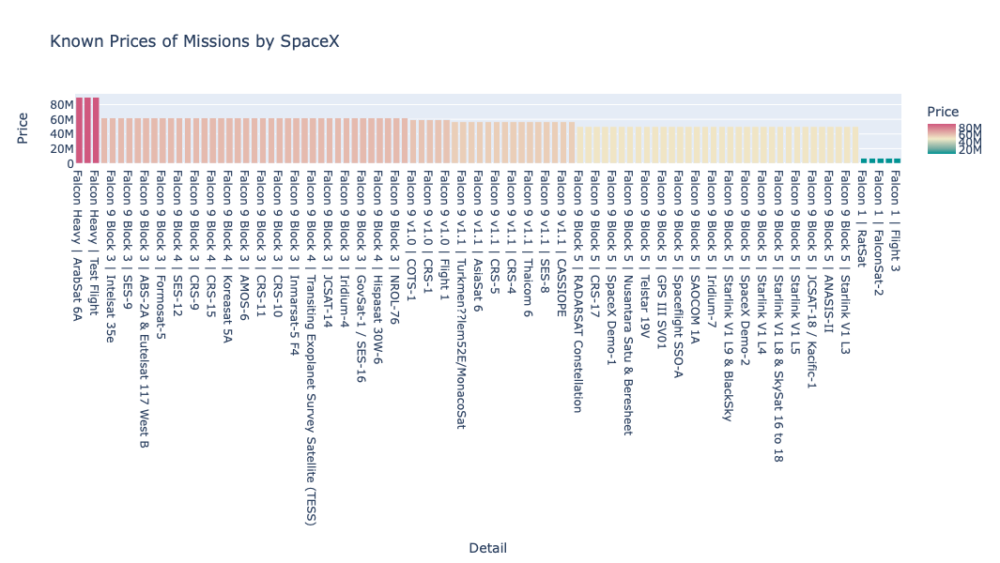

--------------------------------------------


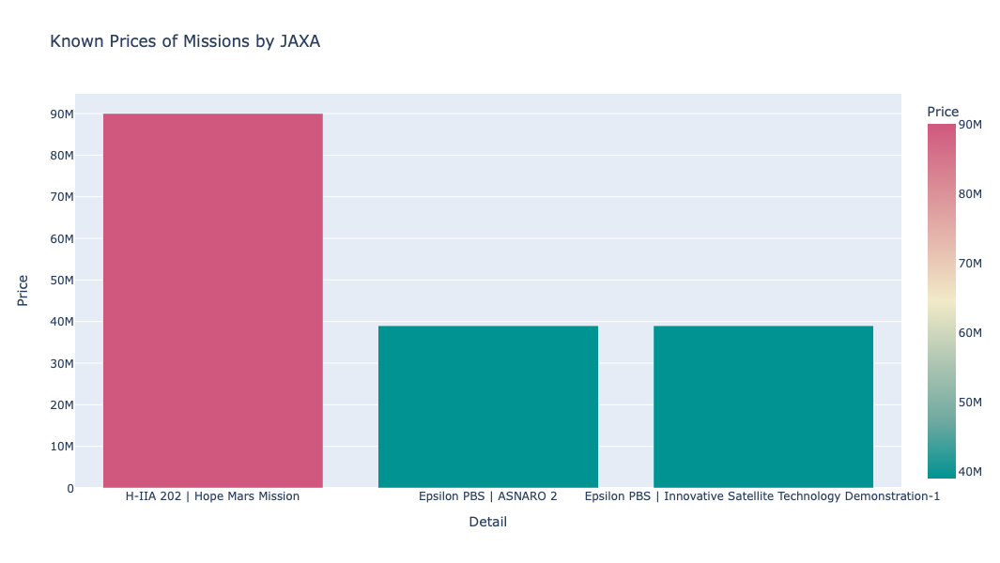

--------------------------------------------


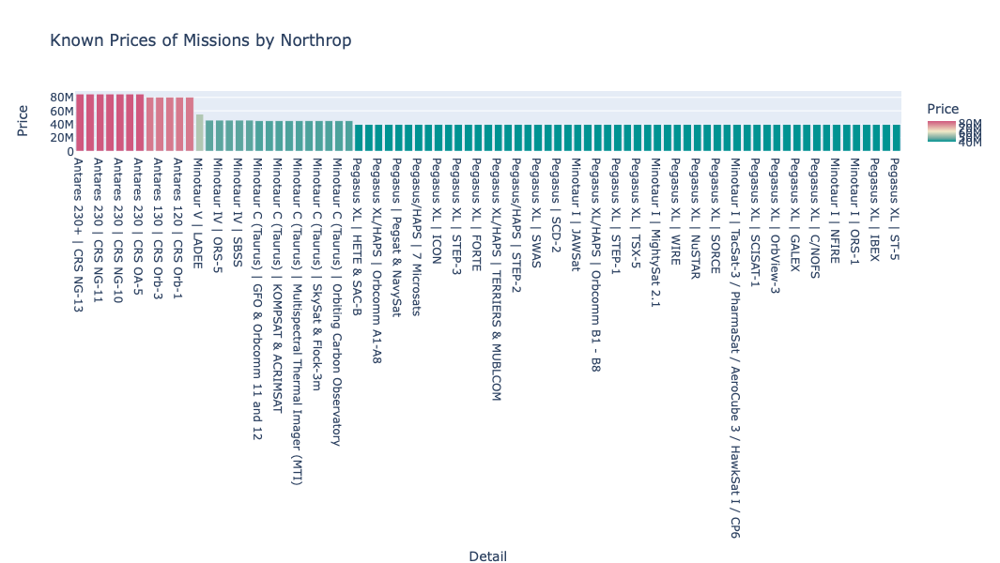

--------------------------------------------


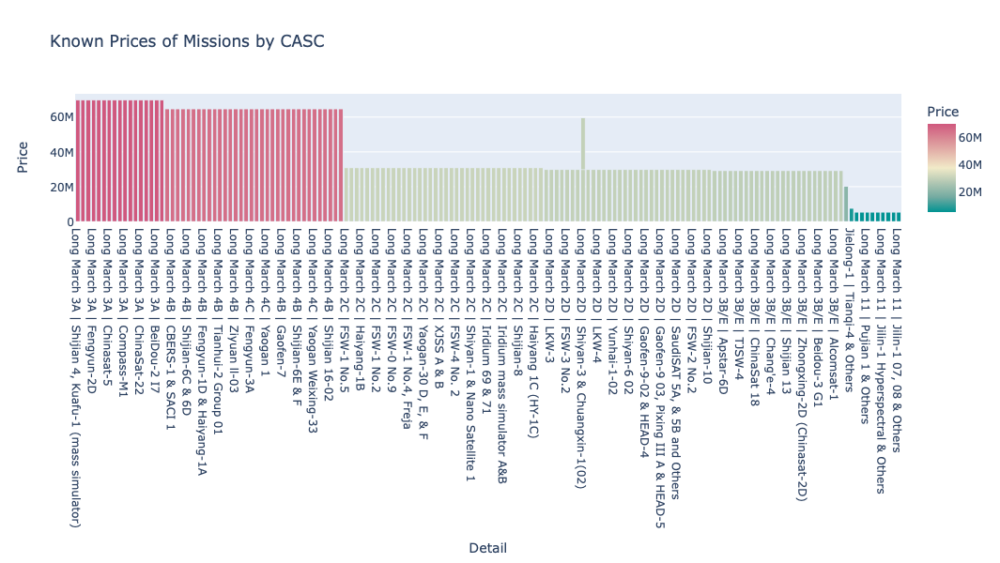

--------------------------------------------


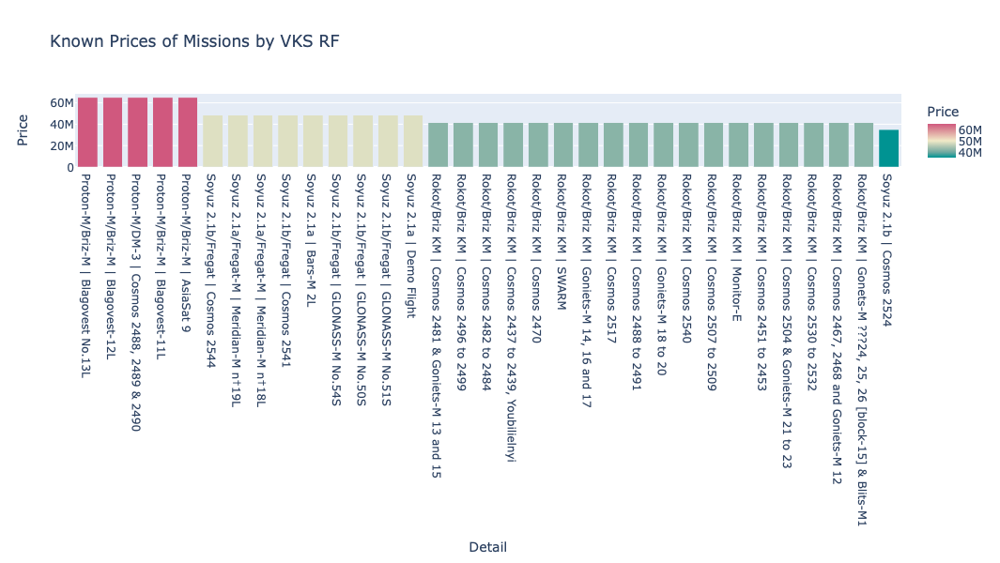

--------------------------------------------


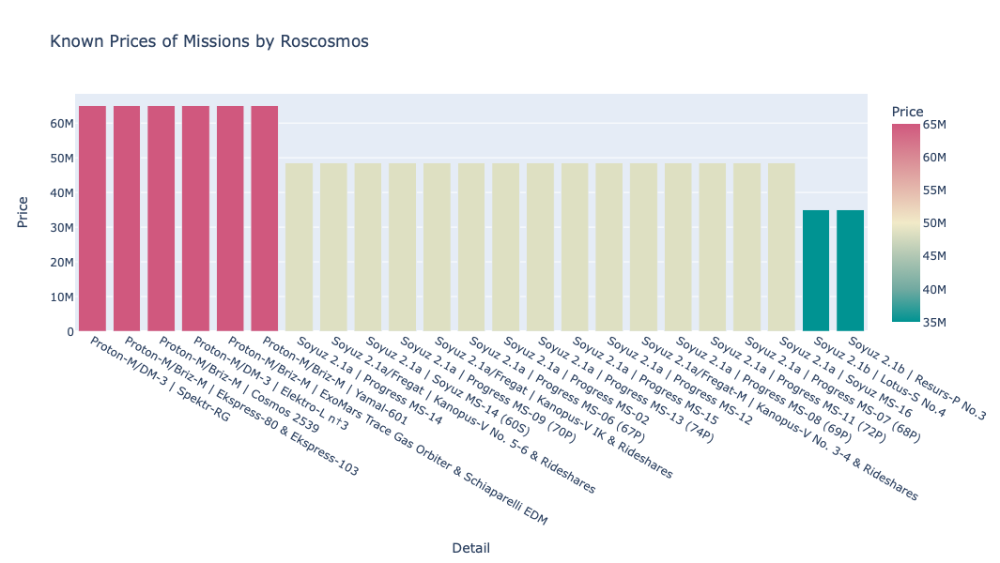

--------------------------------------------


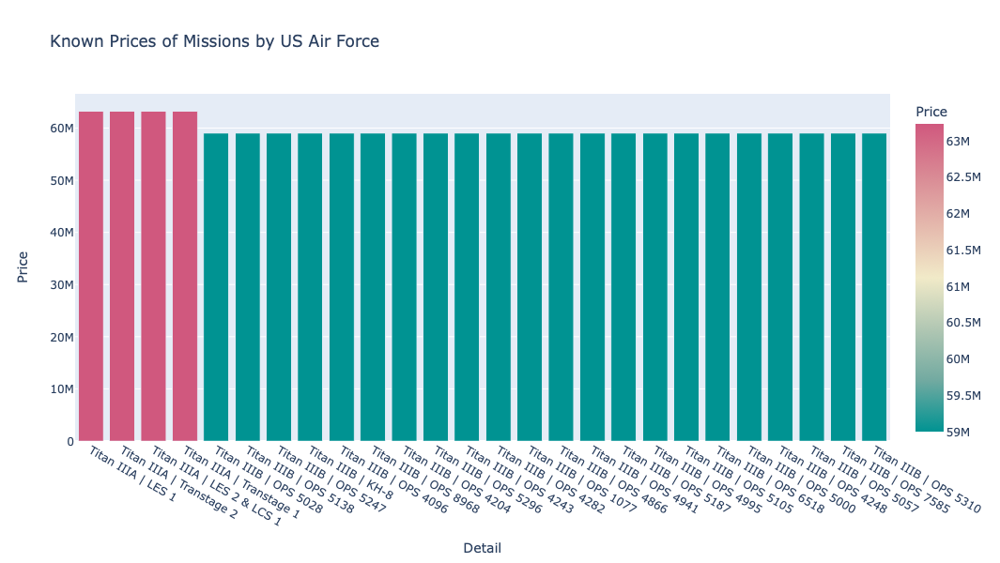

--------------------------------------------


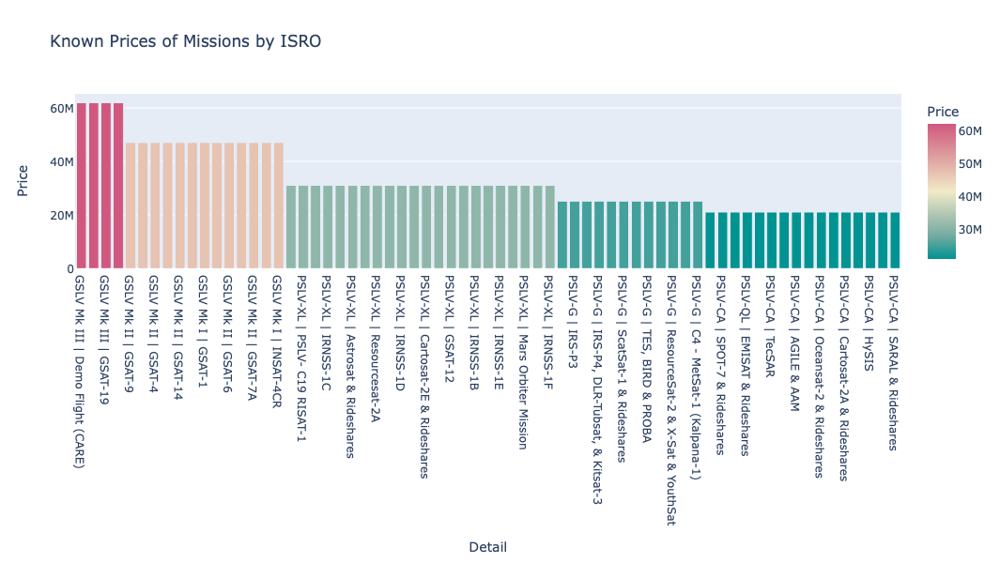

--------------------------------------------


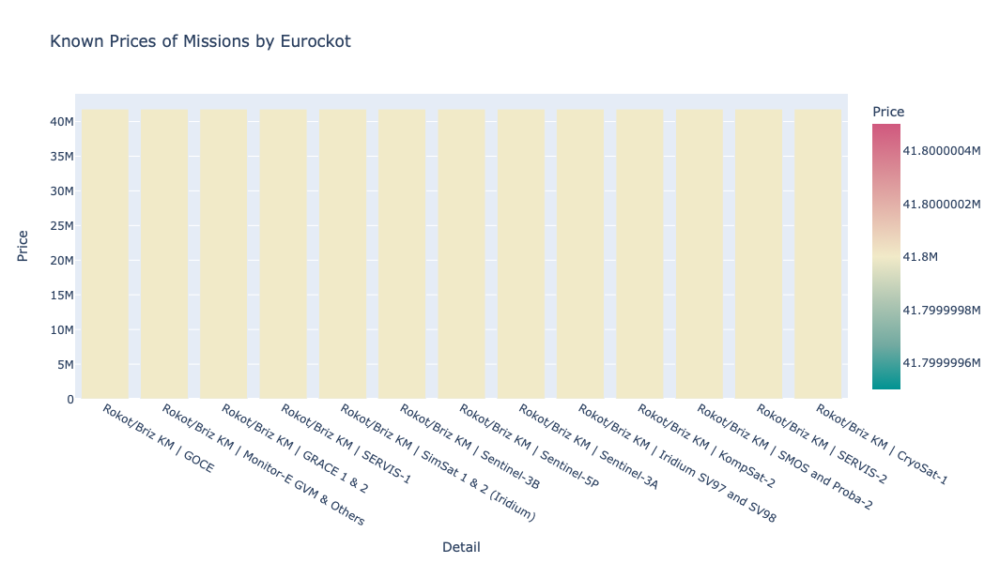

--------------------------------------------


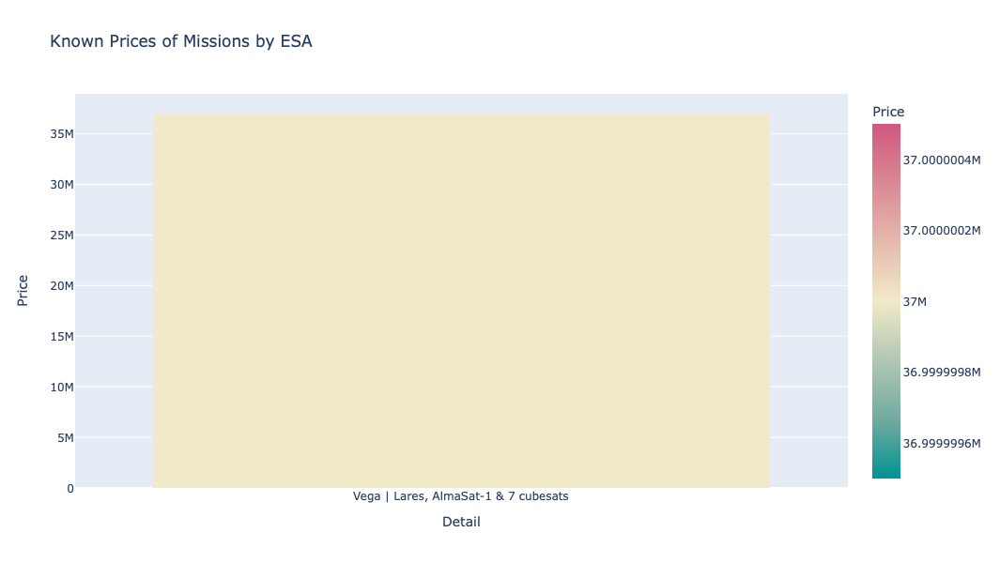

--------------------------------------------


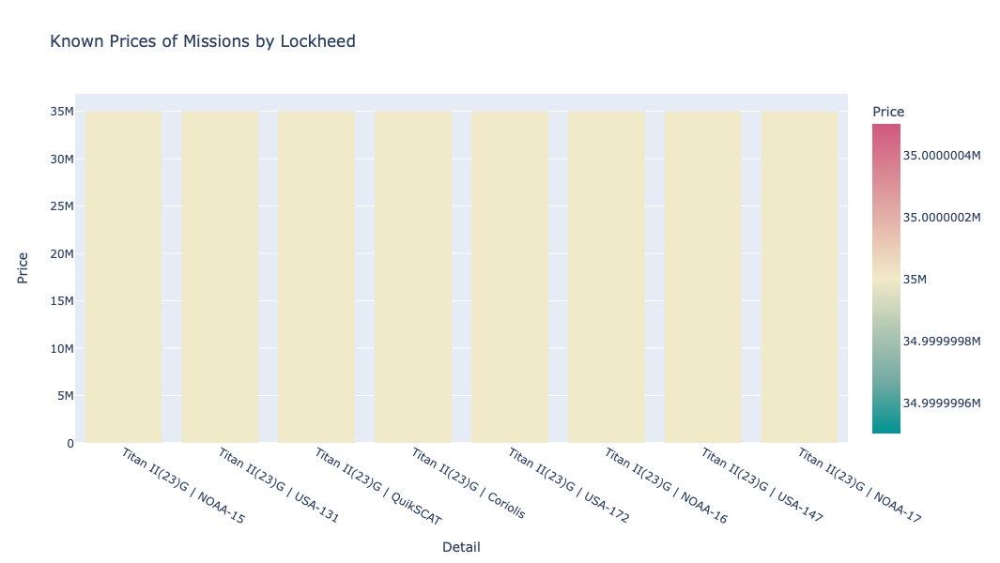

--------------------------------------------


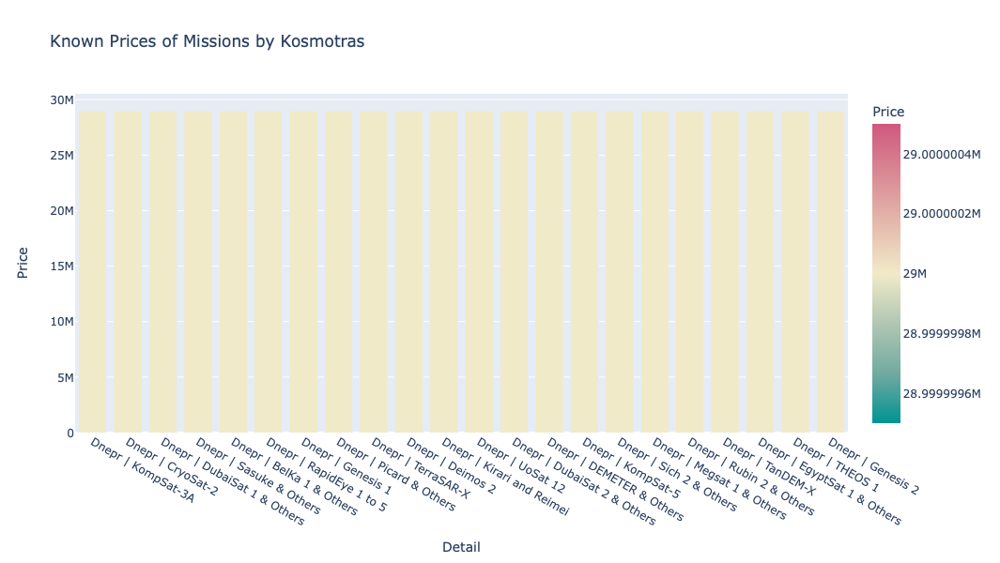

--------------------------------------------


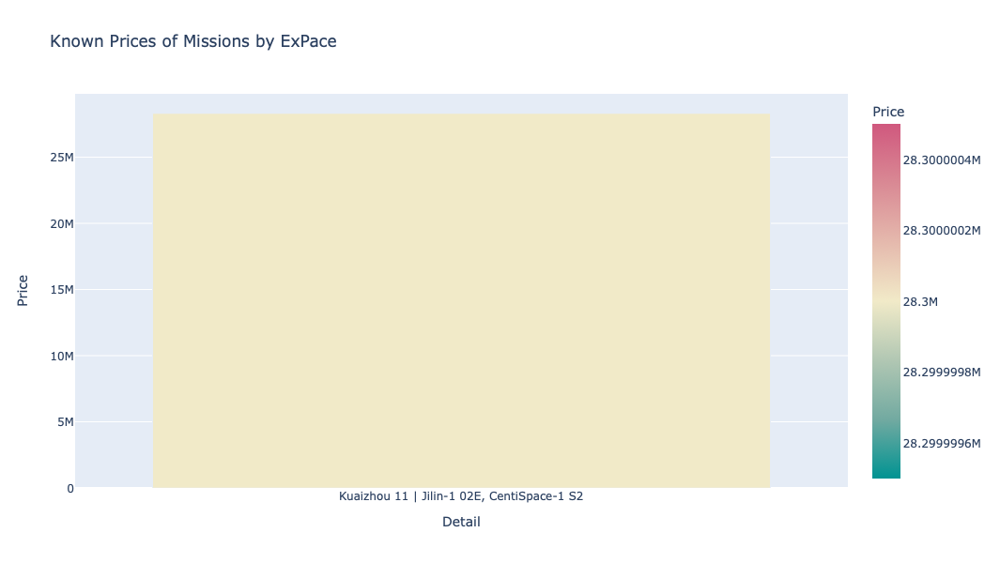

--------------------------------------------


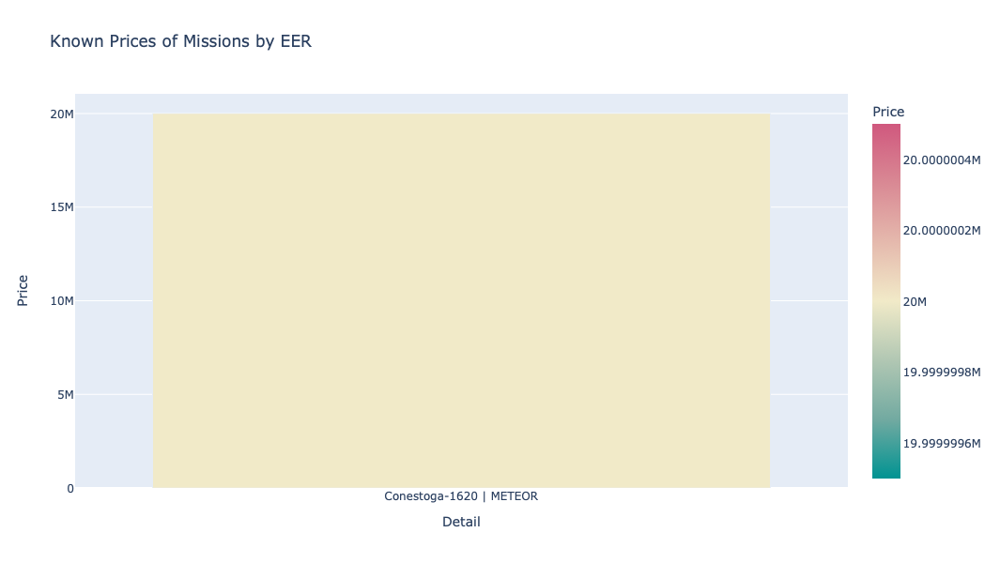

--------------------------------------------


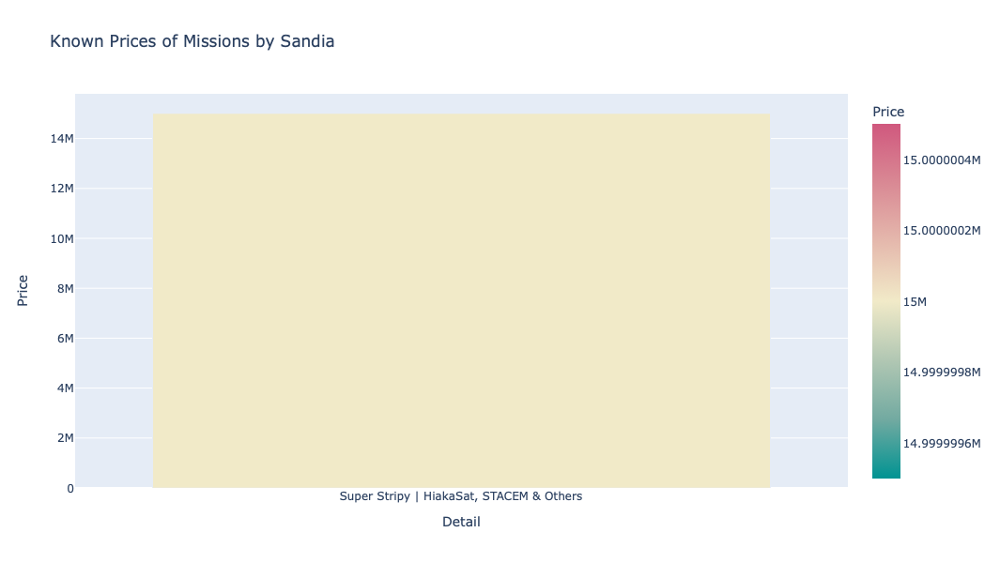

--------------------------------------------


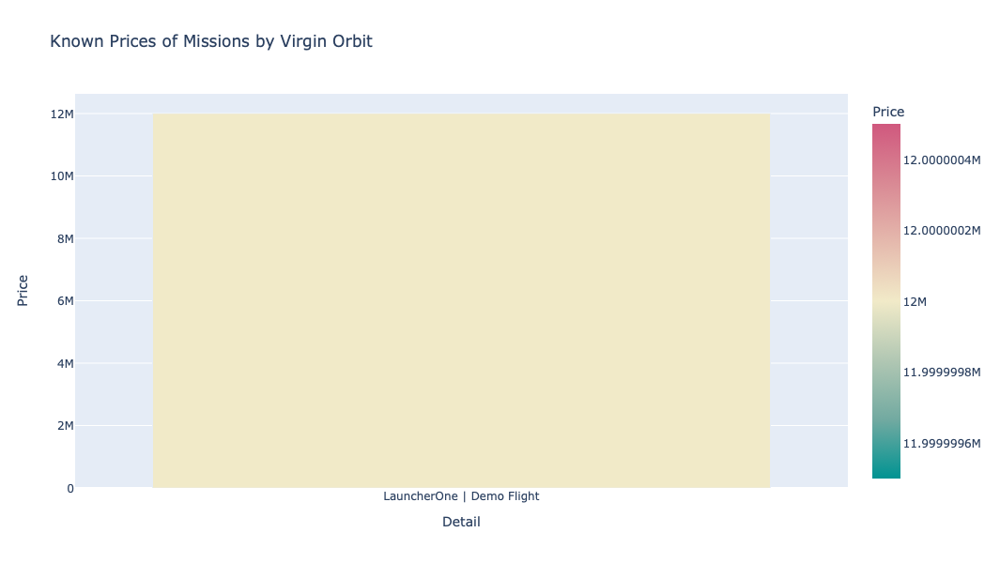

--------------------------------------------


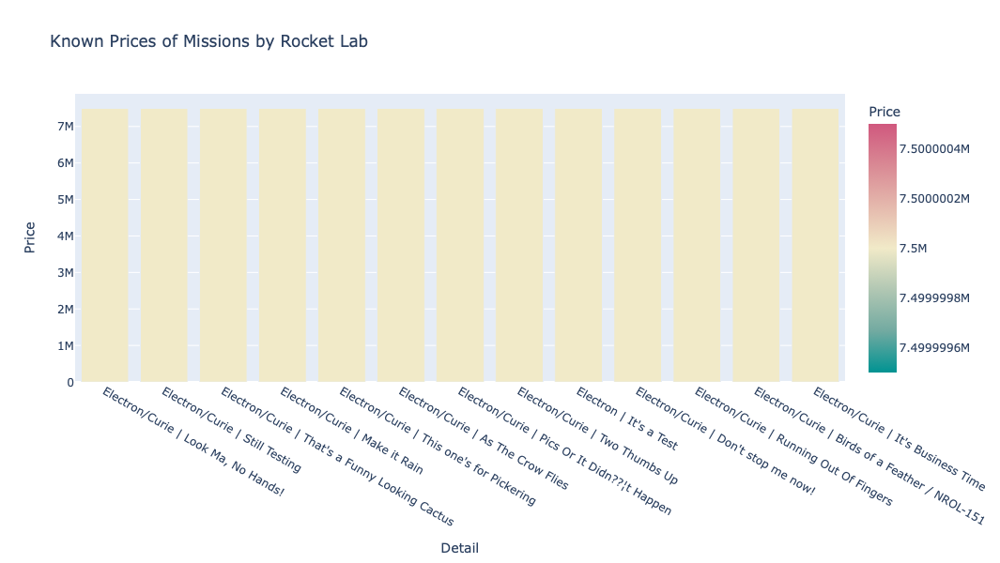

--------------------------------------------


In [ ]:
for ORG in df_Money_Spent_Each_Mession.index.unique():

    df_Money_Spent_Each_Mession_temp = df_Money_Spent_Each_Mession[df_Money_Spent_Each_Mession.index == ORG]

    fig = px.bar(df_Money_Spent_Each_Mession_temp,
                 x=df_Money_Spent_Each_Mession_temp.Detail,
                 y=df_Money_Spent_Each_Mession_temp.Price,
                 color=df_Money_Spent_Each_Mession_temp.Price,
                 color_continuous_scale="tealrose",
                 height=600,
                 title=f"Known Prices of Missions by {ORG}"
                )
    fig.show()
    print("--------------------------------------------")

# Chart the Number of Launches per Year

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.00,Success,USA,USA
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,CHN
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,USA
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.00,Success,Kazakhstan,KAZ
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.00,Success,USA,USA


In [ ]:
df_year = df.Date.str.split(",").str[1].str.strip().str[:4].value_counts().sort_index()

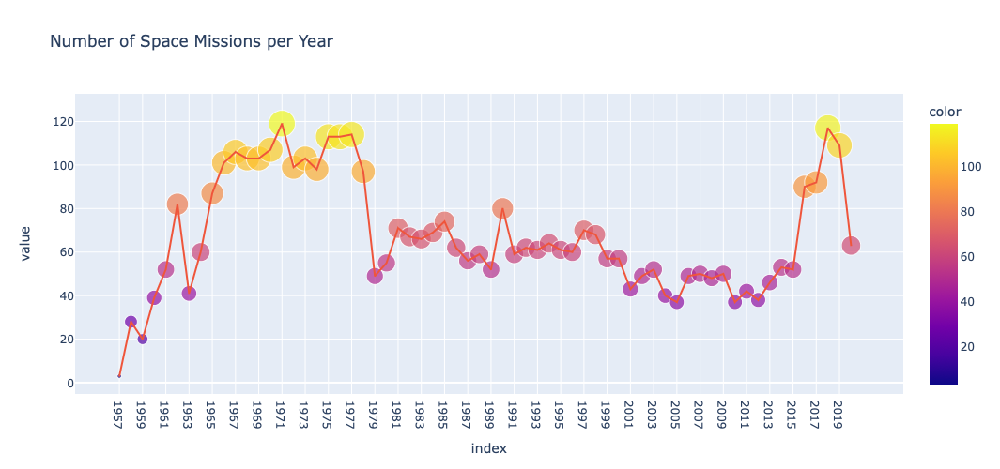

In [ ]:
fig = px.scatter(df_year,
                color=df_year.values,
                size=df_year.values,
                trendline="rolling",
                trendline_options=dict(window=1),
                height=500,
                title="Number of Space Missions per Year",
                )
fig.show()

# Chart the Number of Launches Month-on-Month until the Present

Which month has seen the highest number of launches in all time? Superimpose a rolling average on the month on month time series chart.

In [ ]:
df["Date_Formatted"] = pd.to_datetime(df.Date.str[4:16].str.replace(" ","").str.replace(",",""),format="%b%d%Y")

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.00,Success,USA,USA,2020-08-07
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,CHN,2020-08-06
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,USA,2020-08-04
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.00,Success,Kazakhstan,KAZ,2020-07-30
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.00,Success,USA,USA,2020-07-30


In [ ]:
df["Month"] = pd.to_datetime(df.Date_Formatted.dt.strftime('%Y-%m'))
df_months = df[["Month", "Detail"]].groupby("Month").count()
df_months

,Detail
Month,
1957-10-01,1
1957-11-01,1
1957-12-01,1
1958-02-01,2
1958-03-01,3
...,...
2020-04-01,5
2020-05-01,9
2020-06-01,7


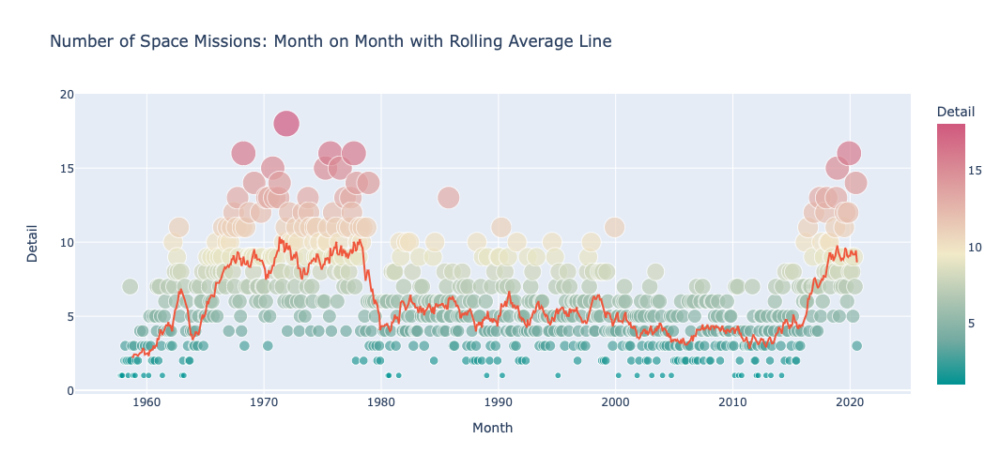

In [ ]:
fig = px.scatter(df_months,
                 x=df_months.index,
                 y=df_months.Detail,
                 color=df_months.Detail,
                 color_continuous_scale="tealrose",
                 size=df_months.Detail,
                 trendline="rolling",
                 trendline_options=dict(window=12),
                 height=500,
                 title="Number of Space Missions: Month on Month with Rolling Average Line",
                )
fig.show()

# Launches per Month: Which months are most popular and least popular for launches?

Some months have better weather than others. Which time of year seems to be best for space missions?

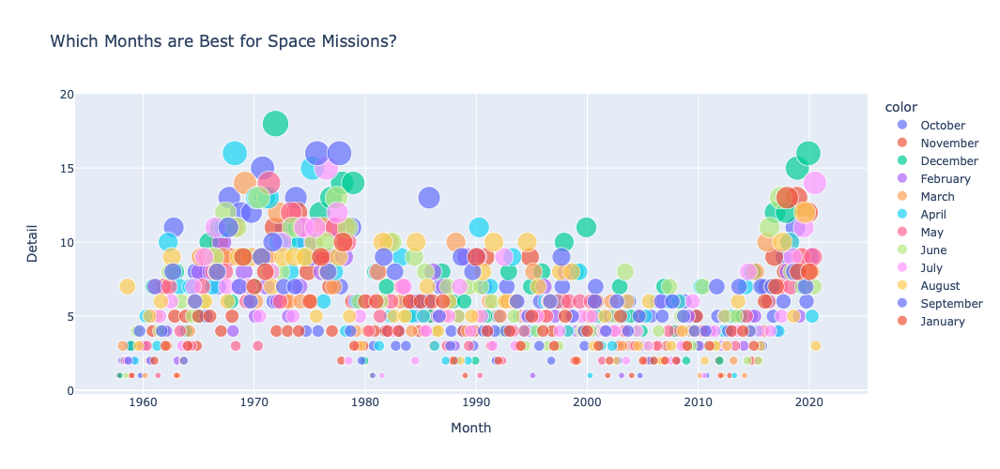

In [ ]:
fig = px.scatter(df_months,
                 x=df_months.index,
                 y=df_months.Detail,
                 color=df_months.index.strftime('%B'),
                 size=df_months.Detail,
                 height=500,
                 title="Which Months are Best for Space Missions?",
                )
fig.show()

# How has the Launch Price varied Over Time?

Create a line chart that shows the average price of rocket launches over time.

In [ ]:
df.head()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month
0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.00,Success,USA,USA,2020-08-07,2020-08-01
1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,CHN,2020-08-06,2020-08-01
2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,USA,2020-08-04,2020-08-01
3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.00,Success,Kazakhstan,KAZ,2020-07-30,2020-07-01
4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.00,Success,USA,USA,2020-07-30,2020-07-01


In [ ]:
df["Year"] = pd.to_datetime(df.Date_Formatted.dt.strftime('%Y'))
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month,Year
4321,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA","Fri Dec 06, 1957 16:44 UTC",Vanguard | Vanguard TV3,StatusRetired,NaN,Failure,USA,USA,1957-12-06,1957-12-01,1957-01-01


In [ ]:
df_time_price = df[["Year","Price"]].groupby("Year").mean("Price").sort_values(by="Year")

df_time_price.dropna(inplace=True)
df_time_price.Price = df_time_price.Price * 1000000
df_time_price.head()

,Price
Year,
1964-01-01,"63,230,000.00"
1965-01-01,"63,230,000.00"
1966-01-01,"59,000,000.00"
1967-01-01,"196,625,000.00"
1968-01-01,"279,200,000.00"


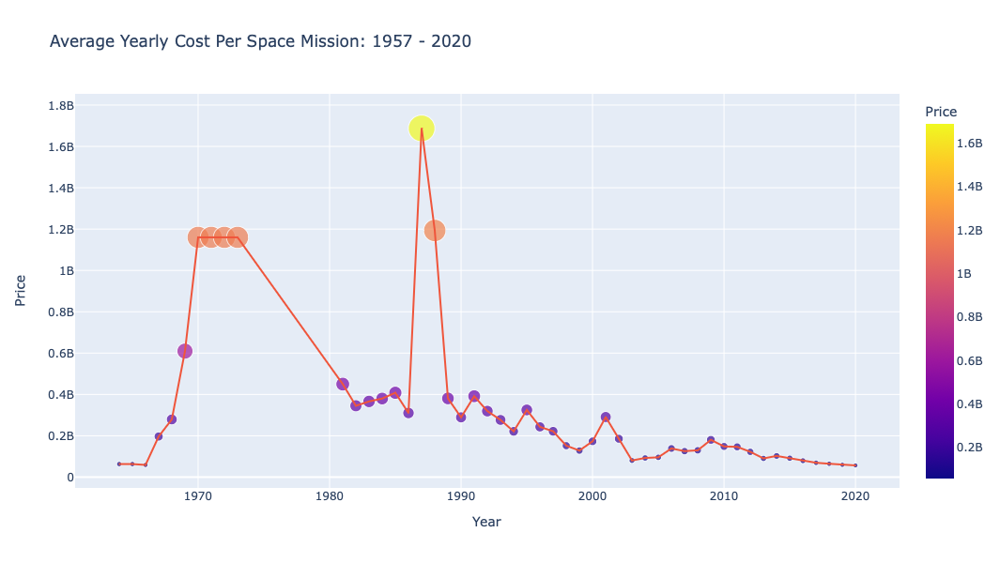

In [ ]:
fig = px.scatter(df_time_price,
                 x=df_time_price.index,
                 y=df_time_price.Price,
                 color=df_time_price.Price,
                 size=df_time_price.Price,
                 height=600,
                 title="Average Yearly Cost Per Space Mission: 1957 - 2020",
                 trendline="rolling",
                 trendline_options=dict(window=1)
            )
fig.show()

# Chart the Number of Launches over Time by the Top 10 Organisations.

How has the dominance of launches changed over time between the different players?

In [ ]:
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month,Year
779,NASA,"LC-39A, Kennedy Space Center, Florida, USA","Sun Mar 15, 2009 23:43 UTC",Space Shuttle Discovery | STS-119,StatusRetired,450.00,Success,USA,USA,2009-03-15,2009-03-01,2009-01-01


In [ ]:
df_yearly_org = df[["Year","Organisation","Detail"]].groupby(
    ["Year","Organisation"], as_index=False).count()

df_top10_org = df[["Organisation","Detail"]].groupby(
    "Organisation", as_index=False).count().sort_values("Detail", ascending=False)[:12]

df_yearly_org_top10 = pd.merge(df_yearly_org, df_top10_org, on=["Organisation"])

df_yearly_org_top10.drop("Detail_y", axis=1, inplace=True)
df_yearly_org_top10.columns = ["Year","Organisation","Missions"]
df_yearly_org_top10.set_index("Year", inplace=True)


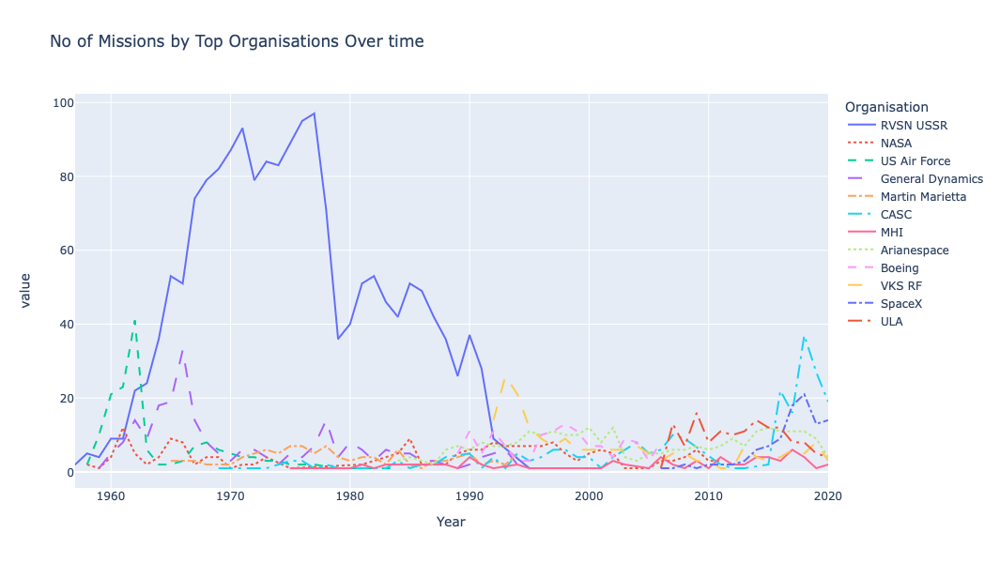

In [ ]:
fig = px.line(
    df_yearly_org_top10,
    color="Organisation",
    height=600,
    line_dash="Organisation",
    title="No of Missions by Top Organisations Over time"
)

fig.show()

In [ ]:
df_yearly_country = df[["Year","Country","Detail"]].groupby(
    ["Year","Country"], as_index=False).count()

df_top10_country = df[["Country","Detail"]].groupby(
    "Country", as_index=False).count().sort_values("Detail", ascending=False)#[:12]

df_yearly_country_top10 = pd.merge(df_yearly_country, df_top10_country, on=["Country"])

df_yearly_country_top10.drop("Detail_y", axis=1, inplace=True)
df_yearly_country_top10.columns = ["Year","Country","Missions"]
df_yearly_country_top10.set_index("Year", inplace=True)


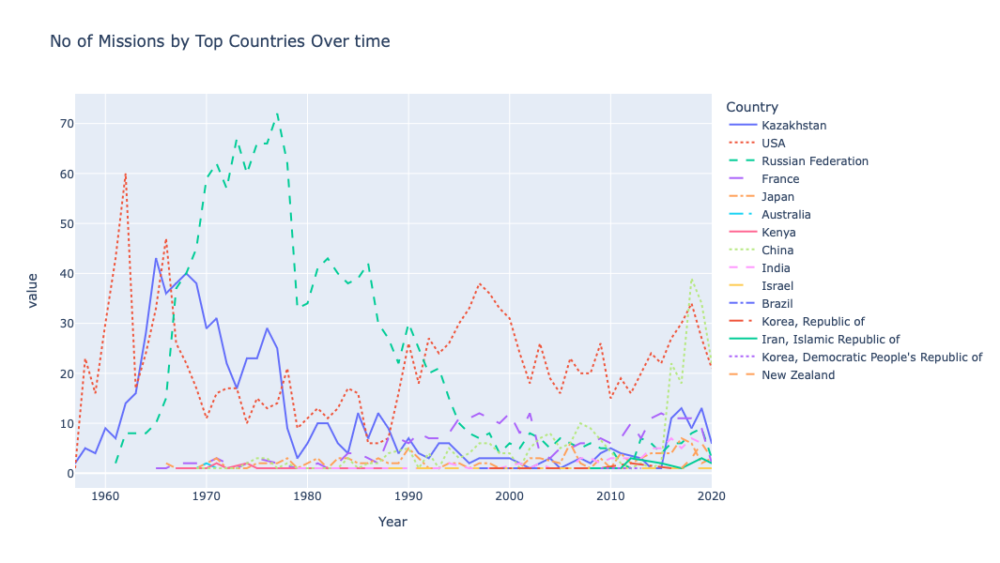

In [ ]:
fig = px.line(
    df_yearly_country_top10,
    color="Country",
    height=600,
    line_dash="Country",
    title="No of Missions by Top Countries Over time"
)

fig.show()

# Cold War Space Race: USA vs USSR

The cold war lasted from the start of the dataset up until 1991.

In [ ]:
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month,Year
3657,RVSN USSR,"Site 31/6, Baikonur Cosmodrome, Kazakhstan","Tue Jun 18, 1968 16:15 UTC",Voskhod | Cosmos 227,StatusRetired,NaN,Success,Kazakhstan,KAZ,1968-06-18,1968-06-01,1968-01-01


In [ ]:
df_coldwar_prep = df[["Year","Country","Detail","Mission_Status"]]

## adding Kazakhstan to Russia
df_coldwar_prep.Country[df_coldwar_prep["Country"] == "Kazakhstan"] = "Russian Federation"

df_top2 = ["Russian Federation", "USA"]
df_cold_war = df_coldwar_prep[df_coldwar_prep.Country.isin(df_top2)]

df_cold_war_year_on_year = df_cold_war[["Year","Country","Detail"]].groupby(
    ["Year","Country"], as_index=False).count()

df_cold_war_year_on_year.columns = ["Year","Country","Missions"]
df_cold_war_year_on_year.set_index("Year", inplace=True)


/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipykernel_27420/2896894892.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_cold_war_year_on_year

,Country,Missions
Year,,
1957-01-01,Russian Federation,2
1957-01-01,USA,1
1958-01-01,Russian Federation,5
1958-01-01,USA,23
1959-01-01,Russian Federation,4
...,...,...
2018-01-01,USA,34
2019-01-01,Russian Federation,22
2019-01-01,USA,27


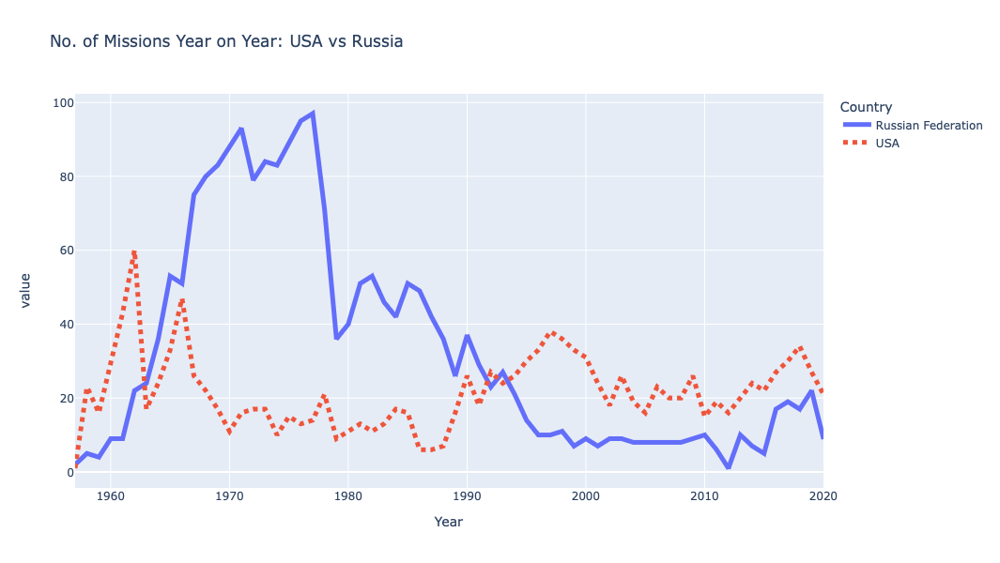

In [ ]:
fig = px.line(
    df_cold_war_year_on_year,
    color="Country",
    height=600,
    line_dash="Country",
    title="No. of Missions Year on Year: USA vs Russia",
)

fig.update_traces(line=dict(width=5))

fig.show()

## Create a Plotly Pie Chart comparing the total number of launches of the USSR and the USA

Hint: Remember to include former Soviet Republics like Kazakhstan when analysing the total number of launches.

In [ ]:
df_cold_war_pie = df_cold_war_year_on_year.groupby("Country").sum("Missions")
df_cold_war_pie

,Missions
Country,
Russian Federation,2099
USA,1387


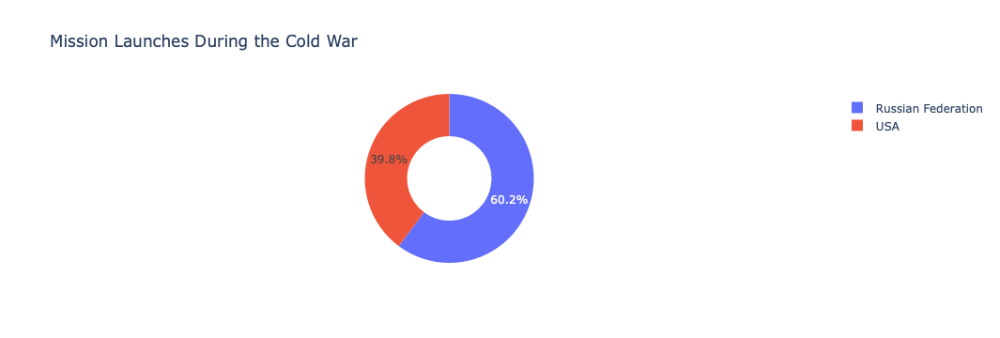

In [ ]:
fig = px.pie(df_cold_war_pie,
             names=df_cold_war_pie.index,
             values=df_cold_war_pie.Missions,
             hole=0.5,
             title="Mission Launches During the Cold War"
            )
fig.show()

## Create a Chart that Shows the Total Number of Launches Year-On-Year by the Two Superpowers

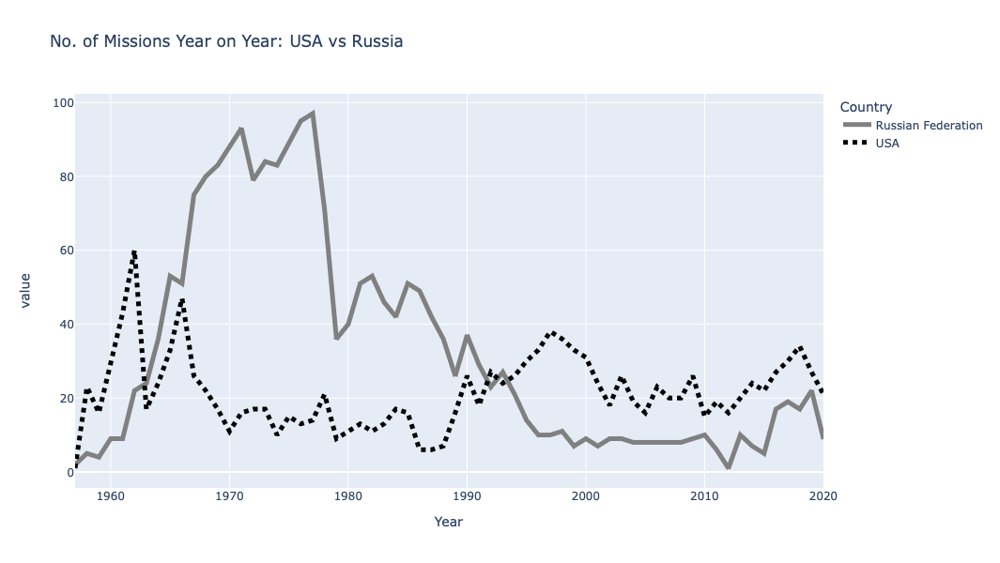

In [ ]:
fig = px.line(
    df_cold_war_year_on_year,
    color="Country",
    color_discrete_sequence=["gray","black"],
    height=600,
    line_dash="Country",
    title="No. of Missions Year on Year: USA vs Russia",
)

fig.update_traces(line=dict(width=5))

fig.show()

## Chart the Total Number of Mission Failures Year on Year.

In [ ]:
df_cold_war

,Year,Country,Detail,Mission_Status
0,2020-01-01,USA,Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,Success
2,2020-01-01,USA,Starship Prototype | 150 Meter Hop,Success
3,2020-01-01,Russian Federation,Proton-M/Briz-M | Ekspress-80 & Ekspress-103,Success
4,2020-01-01,USA,Atlas V 541 | Perseverance,Success
6,2020-01-01,Russian Federation,Soyuz 2.1a | Progress MS-15,Success
...,...,...,...,...
4319,1958-01-01,USA,Vanguard | Vanguard TV3BU,Failure
4320,1958-01-01,USA,Juno I | Explorer 1,Success
4321,1957-01-01,USA,Vanguard | Vanguard TV3,Failure
4322,1957-01-01,Russian Federation,Sputnik 8K71PS | Sputnik-2,Success


In [ ]:
df_cold_war_mission_status = df_cold_war.groupby(["Year","Country","Mission_Status"], as_index=False).count()
df_cold_war_mission_status.columns = ["Year","Country","Mission_Status","Count"]
df_cold_war_mission_status.set_index("Year", inplace=True)
df_cold_war_mission_status

,Country,Mission_Status,Count
Year,,,
1957-01-01,Russian Federation,Success,2
1957-01-01,USA,Failure,1
1958-01-01,Russian Federation,Failure,4
1958-01-01,Russian Federation,Success,1
1958-01-01,USA,Failure,16
...,...,...,...
2019-01-01,USA,Partial Failure,2
2019-01-01,USA,Success,24
2020-01-01,Russian Federation,Success,9


In [ ]:
mission_status = df_cold_war_mission_status.Mission_Status.unique()

In [ ]:
df_cold_war_mission_status[df_cold_war_mission_status.Mission_Status == "Success"].drop("Mission_Status", axis=1)

,Country,Count
Year,,
1957-01-01,Russian Federation,2
1958-01-01,Russian Federation,1
1958-01-01,USA,5
1959-01-01,Russian Federation,2
1959-01-01,USA,6
...,...,...
2018-01-01,USA,33
2019-01-01,Russian Federation,22
2019-01-01,USA,24


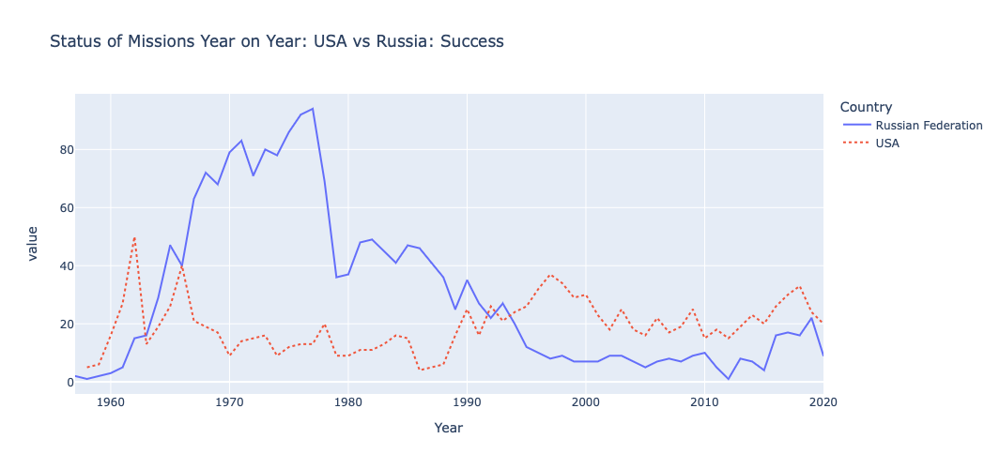

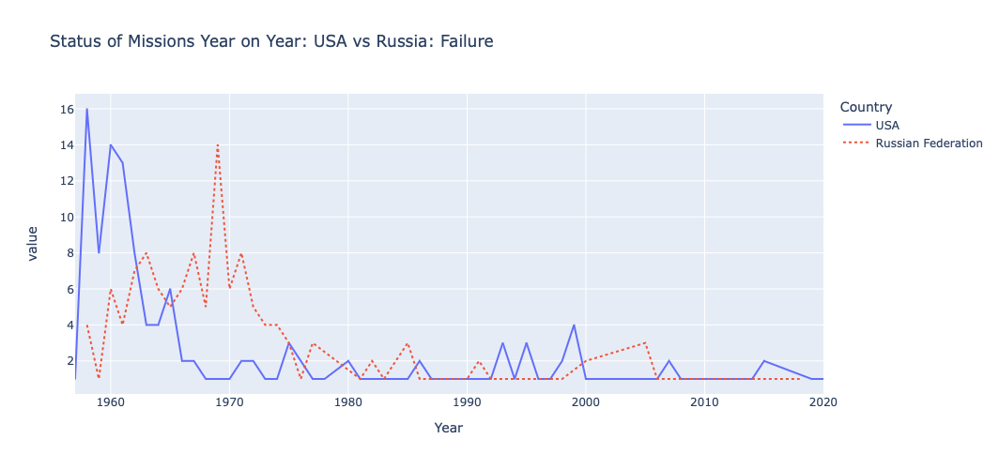

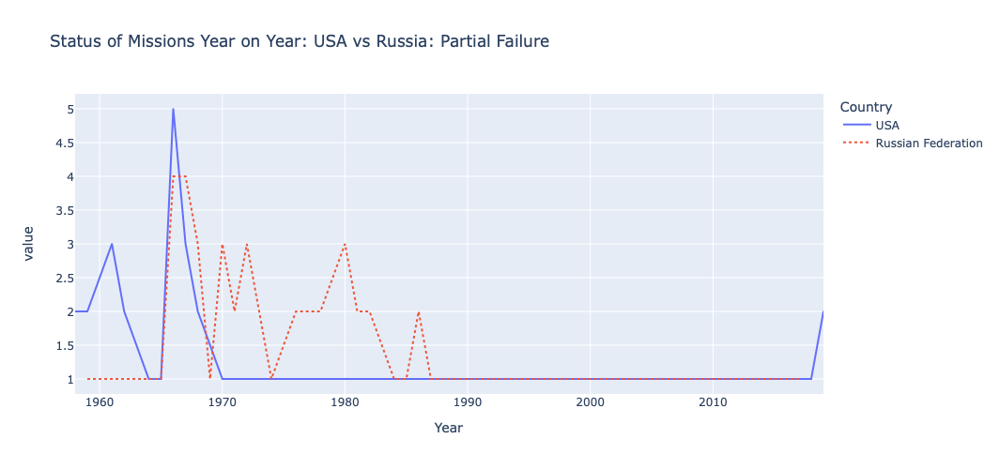

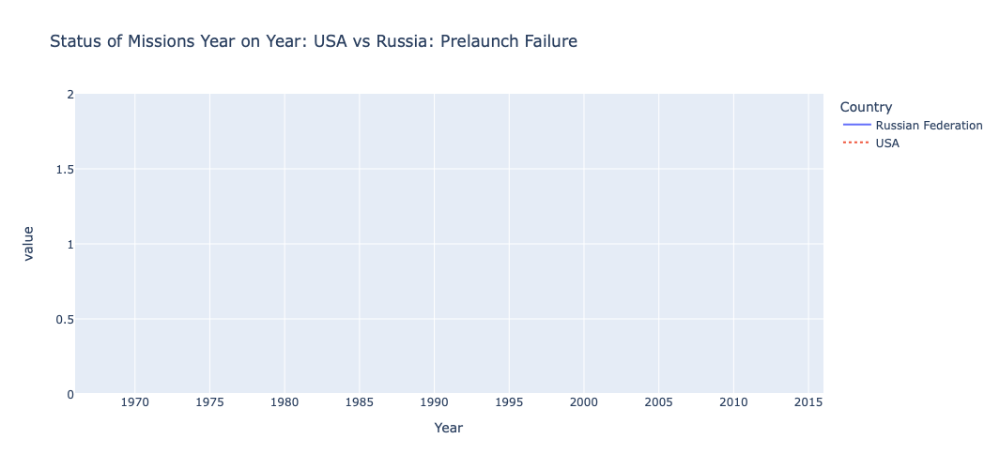

In [ ]:
for status in mission_status:
    fig = px.line(
        df_cold_war_mission_status[df_cold_war_mission_status.Mission_Status == status].drop("Mission_Status", axis=1),
        color="Country",
        line_dash="Country",
        height=500,
        title=f"Status of Missions Year on Year: USA vs Russia: {status}",
    )

    fig.show()

## Chart the Percentage of Failures over Time

Did failures go up or down over time? Did the countries get better at minimising risk and improving their chances of success over time?

In [ ]:
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month,Year
1453,Boeing,"SLC-17B, Cape Canaveral AFS, Florida, USA","Thu Mar 28, 1996 00:21 UTC",Delta II 7925 | USA-117 (GPS IIA-16),StatusRetired,NaN,Success,USA,USA,1996-03-28,1996-03-01,1996-01-01


In [ ]:
df_percent_failures = pd.DataFrame(df[["Year","Mission_Status"]].value_counts().sort_index()).reset_index()
df_percent_failures.columns = ["Year","Mission_Status","Count"]
df_percent_failures = df_percent_failures.pivot(index="Year", columns="Mission_Status", values="Count")
df_percent_failures.fillna(0, inplace=True)
df_percent_failures["Total"] = df_percent_failures.sum(axis=1)
df_percent_failures["Failure_Percent"] = (1 - df_percent_failures.Success/df_percent_failures.Total) * 100

In [ ]:
df_percent_failures

Mission_Status,Failure,Partial Failure,Prelaunch Failure,Success,Total,Failure_Percent
Year,,,,,,
1957-01-01,1.00,0.00,0.00,2.00,3.00,33.33
1958-01-01,20.00,2.00,0.00,6.00,28.00,78.57
1959-01-01,9.00,3.00,0.00,8.00,20.00,60.00
1960-01-01,20.00,0.00,0.00,19.00,39.00,51.28
1961-01-01,17.00,3.00,0.00,32.00,52.00,38.46
...,...,...,...,...,...,...
2016-01-01,2.00,1.00,1.00,86.00,90.00,4.44
2017-01-01,6.00,2.00,0.00,84.00,92.00,8.70
2018-01-01,2.00,2.00,0.00,113.00,117.00,3.42


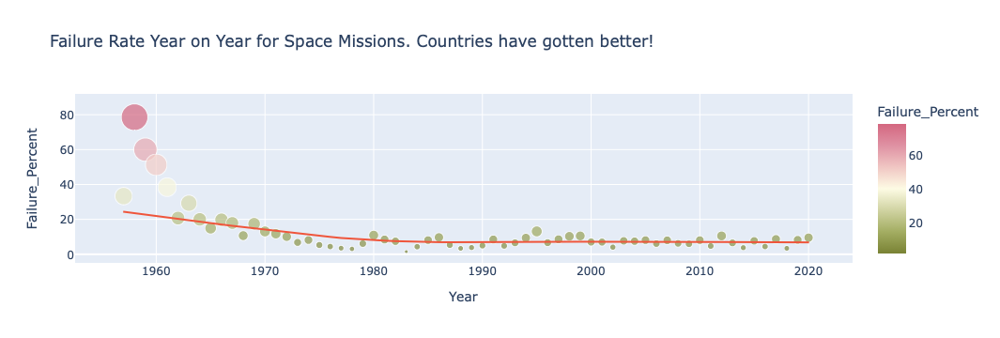

In [ ]:
fix = px.scatter(df_percent_failures,
                 x=df_percent_failures.index,
                 y=df_percent_failures.Failure_Percent,
                 color=df_percent_failures.Failure_Percent,
                 size=df_percent_failures.Failure_Percent,
                 trendline="lowess",
                 color_continuous_scale="armyrose",
                 title="Failure Rate Year on Year for Space Missions. Countries have gotten better!"
                )


fix.show()

# For Every Year Show which Country was in the Lead in terms of Total Number of Launches up to and including including 2020)

Do the results change if we only look at the number of successful launches?

In [ ]:
df.sample()

,Organisation,Location,Date,Detail,Rocket_Status,Price,Mission_Status,Country,ISO,Date_Formatted,Month,Year
328,MHI,"LA-Y1, Tanegashima Space Center, Japan","Sat Aug 19, 2017 05:29 UTC",H-IIA 204 | QZS-3,StatusActive,NaN,Success,Japan,JPN,2017-08-19,2017-08-01,2017-01-01


In [ ]:
df_leader_board = df[["Year","Country"]]
df_leader_board.Country[df_leader_board.Country == "Kazakhstan"] = "Russian Federation"
df_leader_board = df_leader_board.value_counts().reset_index().pivot(index="Year",values=0, columns="Country")
df_leader_board.fillna(0, inplace=True)

for col in df_leader_board.columns:
    df_leader_board[col] = df_leader_board[col].cumsum()

df_leader_board.head()

/var/folders/fz/3cfw8c5506xbvgtb2j0jtqkc0000gn/T/ipykernel_27420/1805756321.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Country,Australia,Brazil,China,France,India,"Iran, Islamic Republic of",Israel,Japan,Kenya,"Korea, Democratic People's Republic of","Korea, Republic of",New Zealand,Russian Federation,USA
Year,,,,,,,,,,,,,,
1957-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,1.00
1958-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.00,24.00
1959-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.00,40.00
1960-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,70.00
1961-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,29.00,113.00


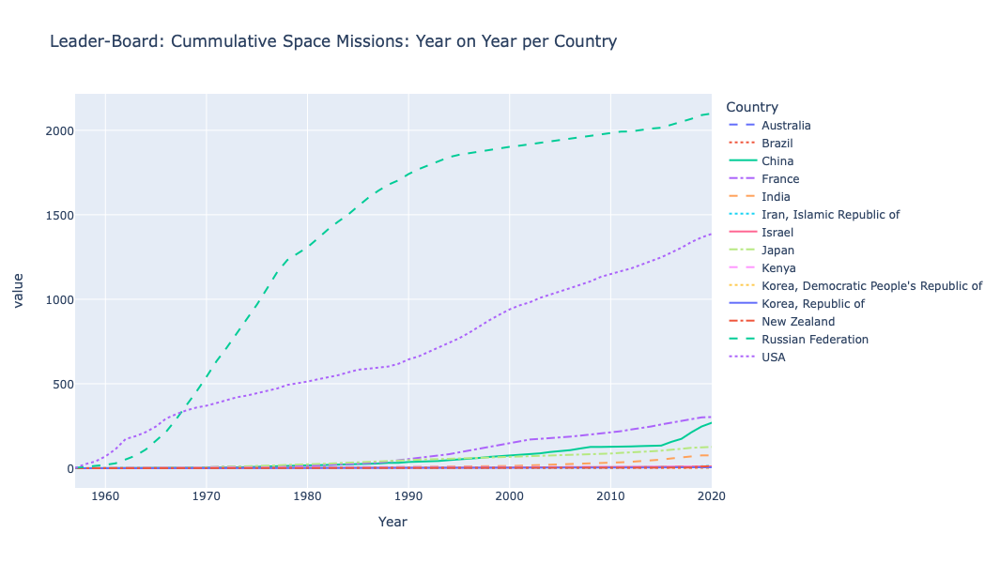

In [ ]:
fig = px.line(df_leader_board,
              height=600,
              title="Leader-Board: Cummulative Space Missions: Year on Year per Country"
             )

style = ["dash", "dot", "solid", "dashdot"]
i = 0
for col in df_leader_board.columns:
    fig.update_traces(patch={"line": {"dash": style[i%4]}}, selector={"legendgroup": col})
    i += 1


fig.show()

# Create a Year-on-Year Chart Showing the Organisation Doing the Most Number of Launches

Which organisation was dominant in the 1970s and 1980s? Which organisation was dominant in 2018, 2019 and 2020?

In [ ]:
df_leader_board_org = df[["Year","Organisation"]]
df_leader_board_org = df_leader_board_org.value_counts().reset_index().pivot(index="Year",values=0, columns="Organisation")
df_leader_board_org.fillna(0, inplace=True)

for col in df_leader_board_org.columns:
    df_leader_board_org[col] = df_leader_board_org[col].cumsum()

df_leader_board_org.head()

Organisation,AEB,AMBA,ASI,Arianespace,Arm??e de l'Air,Blue Origin,Boeing,CASC,CASIC,CECLES,...,SpaceX,Starsem,ULA,US Air Force,US Navy,UT,VKS RF,Virgin Orbit,Yuzhmash,i-Space
Year,,,,,,,,,,,,,,,,,,,,,
1957-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
1958-01-01,0.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,2.00,13.00,0.00,0.00,0.00,0.00,0.00
1959-01-01,0.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,12.00,17.00,0.00,0.00,0.00,0.00,0.00
1960-01-01,0.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,33.00,17.00,0.00,0.00,0.00,0.00,0.00
1961-01-01,0.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,56.00,17.00,0.00,0.00,0.00,0.00,0.00


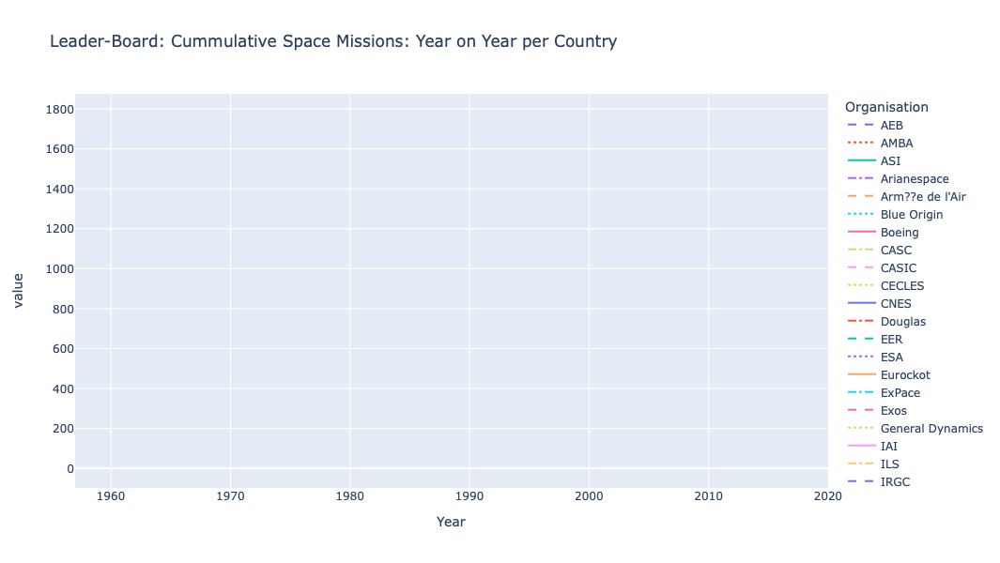

In [ ]:
fig = px.line(df_leader_board_org,
              height=600,
              title="Leader-Board: Cummulative Space Missions: Year on Year per Country"
             )

style = ["dash", "dot", "solid", "dashdot"]
i = 0
for col in df_leader_board_org.columns:
    fig.update_traces(patch={"line": {"dash": style[i%4]}}, selector={"legendgroup": col})
    i += 1


fig.show()